In [1]:
!pip install keras --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 10.4 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 2.15.0
    Uninstalling keras-2.15.0:
      Successfully uninstalled keras-2.15.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.15.0 requires keras<2.16,>=2.15.0, but you have keras 3.3.3 which is incompatible.


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os

#Define the paths to the dataset folders
train_image_folder = '/content/drive/MyDrive/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation 2/train/Original'
train_mask_folder = '/content/drive/MyDrive/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation 2/train/Ground_truth'

valid_image_folder = '/content/drive/MyDrive/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation 2/validation/Original'
valid_mask_folder = '/content/drive/MyDrive/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation 2/validation/Ground_truth'

test_image_folder = '/content/drive/MyDrive/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation 2/test/Original'
test_mask_folder = '/content/drive/MyDrive/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation 2/test/Ground_truth'

#Use os.listdir() to get the list of file names in each folder
train_image_files = os.listdir(train_image_folder)
train_mask_files = os.listdir(train_mask_folder)

valid_image_files = os.listdir(valid_image_folder)
valid_mask_files = os.listdir(valid_mask_folder)

test_image_files = os.listdir(test_image_folder)
test_mask_files = os.listdir(test_mask_folder)

#Create full file paths
train_image_paths = [os.path.join(train_image_folder, filename) for filename in train_image_files]
train_mask_paths = [os.path.join(train_mask_folder, filename) for filename in train_mask_files]

valid_image_paths = [os.path.join(valid_image_folder, filename) for filename in valid_image_files]
valid_mask_paths = [os.path.join(valid_mask_folder, filename) for filename in valid_mask_files]

test_image_paths = [os.path.join(test_image_folder, filename) for filename in test_image_files]
test_mask_paths = [os.path.join(test_mask_folder, filename) for filename in test_mask_files]


train_image_paths = sorted(train_image_paths)
train_mask_paths = sorted(train_mask_paths)

valid_image_paths = sorted(valid_image_paths)
valid_mask_paths = sorted(valid_mask_paths)

test_image_paths = sorted(test_image_paths)
test_mask_paths = sorted(test_mask_paths)

import tensorflow as tf
print(tf.config.list_physical_devices('GPU'))

gpus = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_visible_devices(gpus[0],'GPU')

import tensorflow as tf
BATCH_SIZE = 8
IMAGE_SIZE = 256

def read_image(image_path, mask=False):
    image = tf.io.read_file(image_path)

    if mask:
        image = tf.image.decode_png(image, channels=1)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1] for mask images
        image = tf.where(image >= 0.5, 1.0, 0.0)
        image = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])
    else:
        image = tf.image.decode_png(image, channels=3)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1] for RGB images
        image = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])

    return image


def augment_data(image, mask):
    # Randomly flip the image and mask horizontally
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        mask = tf.image.flip_left_right(mask)

     # Randomly flip the image and mask vertically
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_up_down(image)
        mask = tf.image.flip_up_down(mask)

    # Randomly rotate the image and mask in range -30 to 30 degree
    angle = tf.random.uniform((), minval=-30, maxval=30, dtype=tf.float32)
    image = tf.image.rot90(image, k=tf.cast(angle / 30, dtype=tf.int32))
    mask = tf.image.rot90(mask, k=tf.cast(angle / 30, dtype=tf.int32))

    return image, mask


def load_data(image_list, mask_list):
    image = read_image(image_list)
    mask = read_image(mask_list, mask=True)
    return image, mask


def data_generator(image_list, mask_list, augment=False, batch_size=None, shuffle_buffer_size=None):
    dataset = tf.data.Dataset.from_tensor_slices((image_list, mask_list))
    dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)

    if shuffle_buffer_size is not None:
        dataset = dataset.shuffle(buffer_size=shuffle_buffer_size, seed=42)


    if augment:
        dataset = dataset.map(augment_data, num_parallel_calls=tf.data.AUTOTUNE)

    if batch_size is not None:
        dataset = dataset.batch(batch_size, drop_remainder=True)

    return dataset

shuffle_buffer_size_train = len(train_image_paths)
shuffle_buffer_size_val = len(valid_image_paths)

# Create augmented train_dataset with a specific batch size
train_dataset = data_generator(train_image_paths, train_mask_paths, augment=True, batch_size=BATCH_SIZE, shuffle_buffer_size=shuffle_buffer_size_train)

# Create validation dataset without augmentation
val_dataset = data_generator(valid_image_paths, valid_mask_paths, batch_size=BATCH_SIZE, shuffle_buffer_size=shuffle_buffer_size_val)

print("Train Dataset:", train_dataset)
print("Val Dataset:", val_dataset)


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Train Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(8, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(8, 256, 256, 1), dtype=tf.float32, name=None))>
Val Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(8, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(8, 256, 256, 1), dtype=tf.float32, name=None))>


In [4]:
!pip install tf_explain
from IPython.display import clear_output as cls

cls()

import os
import keras
import numpy as np

# Data Visualization
import matplotlib.pyplot as plt

# Model
from keras.layers import ReLU
from keras.layers import Input
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import Concatenate
from keras.layers import UpSampling2D
from keras.layers import AveragePooling2D
from keras.models import Sequential, Model
from keras.layers import BatchNormalization

# Pretrained Model
from tensorflow.keras.applications import Xception
from tensorflow.keras.layers import ZeroPadding2D

# Callbacks
from keras.callbacks import Callback, ModelCheckpoint

# Model Visualization
from tensorflow.keras.utils import plot_model

# Model Explaination
from tf_explain.core.grad_cam import GradCAM

from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, Add, MaxPooling2D


@keras.utils.register_keras_serializable(package="Custom", name="ConvBlock")

class ConvBlock(Layer):

    def __init__(self, filters=256, kernel_size=3, dilation_rate=1, **kwargs):
        super(ConvBlock, self).__init__(**kwargs)

        self.filters = filters
        self.kernel_size = kernel_size
        self.dilation_rate = dilation_rate

        self.net = Sequential([
            Conv2D(filters, kernel_size=kernel_size, padding='same', dilation_rate=dilation_rate, use_bias=False, kernel_initializer='he_normal'),
            BatchNormalization(),
            ReLU()
        ])

    def call(self, X):
        return self.net(X)

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "kernel_size":self.kernel_size,
            "dilation_rate":self.dilation_rate,
        }

def AtrousSpatialPyramidPooling(X):
    B, H, W, C = X.shape

    # Image Pooling
    image_pool = AveragePooling2D(pool_size=(H, W), name="ASPP-AvgPool")(X)
    image_pool = ConvBlock(kernel_size=1, name="ASPP-ImagePool-CB")(image_pool)
    image_pool = UpSampling2D(size=(H//image_pool.shape[1], W//image_pool.shape[2]), name="ASPP-ImagePool-UpSample")(image_pool)

    # Atrous Oprtations
    conv_1  = ConvBlock(kernel_size=1, dilation_rate=1, name="ASPP-CB-1")(X)
    conv_6  = ConvBlock(kernel_size=3, dilation_rate=6, name="ASPP-CB-6")(X)
    conv_12 = ConvBlock(kernel_size=3, dilation_rate=12, name="ASPP-CB-12")(X)
    conv_18 = ConvBlock(kernel_size=3, dilation_rate=18, name="ASPP-CB-18")(X)

    # Combine All
    combined = Concatenate(name="ASPP-Combine")([image_pool, conv_1, conv_6, conv_12, conv_18])
    processed = ConvBlock(kernel_size=1, name="ASPP-Net")(combined)

    # Final Output
    return processed

import numpy as np

def show_images(data, model=None, explain=False, n_images=6, SIZE=(25,10)):

    # Plot Configurations
    if model is not None:
        if explain:
            n_cols = 8
        else:
            n_cols = 4
    else:
        n_cols = 3

    # Iterate through data
    for plot_no in range(1, n_images+1):
        for index, (images, masks) in enumerate(iter(data)):

            # Select Items
            id = np.random.randint(len(images))
            image, mask = images[id], masks[id]

            if model is not None:

                if explain:

                    # Make Prediction
                    pred_mask = model.predict(image[np.newaxis, ...])[0]


                    image_numpy = image.numpy()

                    image_with_batch = image_numpy[np.newaxis, ...]


                    # Figure
                    plt.figure(figsize=SIZE)

                    # Original Image
                    plt.subplot(1, n_cols, 1)
                    plt.imshow(image)
                    plt.axis('off')
                    plt.title("Original Image")

                    # Original Mask
                    plt.subplot(1, n_cols, 2)
                    plt.imshow(mask, cmap='gray')
                    plt.axis('off')
                    plt.title('Original Mask')

                    # Predicted Mask
                    plt.subplot(1, n_cols, 3)
                    plt.imshow(pred_mask, cmap='gray')
                    plt.axis('off')
                    plt.title("Predicted Mask")

                    # Show Image
                    plt.show()

                else:
                    # Make Prediction
                    pred_mask = model.predict(image[np.newaxis, ...])[0]


                    # Figure
                    plt.figure(figsize=SIZE)

                    # Original Image
                    plt.subplot(1, n_cols, 1)
                    plt.imshow(image)
                    plt.axis('off')
                    plt.title("Original Image")

                    # Original Mask
                    plt.subplot(1, n_cols, 2)
                    plt.imshow(mask, cmap='gray')
                    plt.axis('off')
                    plt.title('Original Mask')

                    # Predicted Mask
                    plt.subplot(1, n_cols, 3)
                    plt.imshow(pred_mask, cmap='gray')
                    plt.axis('off')
                    plt.title("Predicted Mask")

                    plt.show()

            else:

                # Figure
                plt.figure(figsize=SIZE)

                # Original Image
                plt.subplot(1, n_cols, 1)
                plt.imshow(image)
                plt.axis('off')
                plt.title("Original Image")

                # Original Mask
                plt.subplot(1, n_cols, 2)
                plt.imshow(mask, cmap='gray')
                plt.axis('off')
                plt.title('Original Mask')

                # Mixed
                plt.subplot(1, n_cols, 3)
                plt.imshow(image)
                plt.imshow(mask, alpha=0.4)
                plt.axis('off')
                plt.title("Overlaped Image")

                # Show Image
                plt.show()

            # Break Loop
            break

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf  # For tf.data and preprocessing only.
import keras
from keras import layers
from keras import ops

@keras.utils.register_keras_serializable(package="Custom", name="WindowAttention")

class WindowAttention(layers.Layer):
    def __init__(
        self,
        dim,
        window_size,
        num_heads,
        qkv_bias=True,
        dropout_rate=0.0,
        **kwargs,
    ):
        super().__init__(**kwargs)
        self.dim = dim
        self.window_size = window_size
        self.num_heads = num_heads
        self.scale = (dim // num_heads) ** -0.5
        self.qkv = layers.Dense(dim * 3, use_bias=qkv_bias)
        self.dropout = layers.Dropout(dropout_rate)
        self.proj = layers.Dense(dim)

        num_window_elements = (2 * self.window_size[0] - 1) * (
            2 * self.window_size[1] - 1
        )
        self.relative_position_bias_table = self.add_weight(
            shape=(num_window_elements, self.num_heads),
            initializer=keras.initializers.Zeros(),
            trainable=True,
        )
        coords_h = np.arange(self.window_size[0])
        coords_w = np.arange(self.window_size[1])
        coords_matrix = np.meshgrid(coords_h, coords_w, indexing="ij")
        coords = np.stack(coords_matrix)
        coords_flatten = coords.reshape(2, -1)
        relative_coords = coords_flatten[:, :, None] - coords_flatten[:, None, :]
        relative_coords = relative_coords.transpose([1, 2, 0])
        relative_coords[:, :, 0] += self.window_size[0] - 1
        relative_coords[:, :, 1] += self.window_size[1] - 1
        relative_coords[:, :, 0] *= 2 * self.window_size[1] - 1
        relative_position_index = relative_coords.sum(-1)

        self.relative_position_index = keras.Variable(
            initializer=relative_position_index,
            shape=relative_position_index.shape,
            dtype="int",
            trainable=False,
        )

    def call(self, x, mask=None):
        _, size, channels = x.shape
        head_dim = channels // self.num_heads
        x_qkv = self.qkv(x)
        x_qkv = ops.reshape(x_qkv, (-1, size, 3, self.num_heads, head_dim))
        x_qkv = ops.transpose(x_qkv, (2, 0, 3, 1, 4))
        q, k, v = x_qkv[0], x_qkv[1], x_qkv[2]
        q = q * self.scale
        k = ops.transpose(k, (0, 1, 3, 2))
        attn = q @ k

        num_window_elements = self.window_size[0] * self.window_size[1]
        relative_position_index_flat = ops.reshape(self.relative_position_index, (-1,))
        relative_position_bias = ops.take(
            self.relative_position_bias_table,
            relative_position_index_flat,
            axis=0,
        )
        relative_position_bias = ops.reshape(
            relative_position_bias,
            (num_window_elements, num_window_elements, -1),
        )
        relative_position_bias = ops.transpose(relative_position_bias, (2, 0, 1))
        attn = attn + ops.expand_dims(relative_position_bias, axis=0)

        if mask is not None:
            nW = mask.shape[0]
            mask_float = ops.cast(
                ops.expand_dims(ops.expand_dims(mask, axis=1), axis=0),
                "float32",
            )
            attn = ops.reshape(attn, (-1, nW, self.num_heads, size, size)) + mask_float
            attn = ops.reshape(attn, (-1, self.num_heads, size, size))
            attn = keras.activations.softmax(attn, axis=-1)
        else:
            attn = keras.activations.softmax(attn, axis=-1)
        attn = self.dropout(attn)

        x_qkv = attn @ v
        x_qkv = ops.transpose(x_qkv, (0, 2, 1, 3))
        x_qkv = ops.reshape(x_qkv, (-1, size, channels))
        x_qkv = self.proj(x_qkv)
        x_qkv = self.dropout(x_qkv)
        return x_qkv

def window_partition(x, window_size):
    _, height, width, channels = x.shape
    patch_num_y = height // window_size
    patch_num_x = width // window_size
    x = ops.reshape(
        x,
        (
            -1,
            patch_num_y,
            window_size,
            patch_num_x,
            window_size,
            channels,
        ),
    )
    x = ops.transpose(x, (0, 1, 3, 2, 4, 5))
    windows = ops.reshape(x, (-1, window_size, window_size, channels))
    return windows


def window_reverse(windows, window_size, height, width, channels):
    patch_num_y = height // window_size
    patch_num_x = width // window_size
    x = ops.reshape(
        windows,
        (
            -1,
            patch_num_y,
            patch_num_x,
            window_size,
            window_size,
            channels,
        ),
    )
    x = ops.transpose(x, (0, 1, 3, 2, 4, 5))
    x = ops.reshape(x, (-1, height, width, channels))
    # print(x.shape)
    return x

# num_classes = 100
input_shape = (256, 256, 3)
IMAGE_SIZE = 256

patch_size = (16, 16)  # 2-by-2 sized patches
dropout_rate = 0.03  # Dropout rate
num_heads = 8  # Attention heads
embed_dim = 64  # Embedding dimension
num_mlp = 256  # MLP layer size
# Convert embedded patches to query, key, and values with a learnable additive
# value
qkv_bias = True
window_size = 2  # Size of attention window
shift_size = 1  # Size of shifting window
image_dimension = 256  # Initial image size

num_patch_x = input_shape[0] // patch_size[0]
num_patch_y = input_shape[1] // patch_size[1]

@keras.utils.register_keras_serializable(package="Custom", name="SwinTransformer")

class SwinTransformer(layers.Layer):
    def __init__(
        self,
        dim,
        num_patch,
        num_heads,
        window_size=7,
        shift_size=0,
        num_mlp=1024,
        qkv_bias=True,
        dropout_rate=0.0,
        **kwargs,
    ):
        super().__init__(**kwargs)

        self.dim = dim  # number of input dimensions
        self.num_patch = num_patch  # number of embedded patches
        self.num_heads = num_heads  # number of attention heads
        self.window_size = window_size  # size of window
        self.shift_size = shift_size  # size of window shift
        self.num_mlp = num_mlp  # number of MLP nodes

        self.norm1 = layers.LayerNormalization(epsilon=1e-5)
        self.attn = WindowAttention(
            dim,
            window_size=(self.window_size, self.window_size),
            num_heads=num_heads,
            qkv_bias=qkv_bias,
            dropout_rate=dropout_rate,
        )
        self.drop_path = layers.Dropout(dropout_rate)
        self.norm2 = layers.LayerNormalization(epsilon=1e-5)

        self.mlp = keras.Sequential(
            [
                layers.Dense(num_mlp),
                layers.Activation(keras.activations.gelu),
                layers.Dropout(dropout_rate),
                layers.Dense(dim),
                layers.Dropout(dropout_rate),
            ]
        )

        if min(self.num_patch) < self.window_size:
            self.shift_size = 0
            self.window_size = min(self.num_patch)

    def build(self, input_shape):
        if self.shift_size == 0:
            self.attn_mask = None
        else:
            height, width = self.num_patch
            h_slices = (
                slice(0, -self.window_size),
                slice(-self.window_size, -self.shift_size),
                slice(-self.shift_size, None),
            )
            w_slices = (
                slice(0, -self.window_size),
                slice(-self.window_size, -self.shift_size),
                slice(-self.shift_size, None),
            )
            mask_array = np.zeros((1, height, width, 1))
            count = 0
            for h in h_slices:
                for w in w_slices:
                    mask_array[:, h, w, :] = count
                    count += 1
            mask_array = ops.convert_to_tensor(mask_array)

            # mask array to windows
            mask_windows = window_partition(mask_array, self.window_size)
            mask_windows = ops.reshape(
                mask_windows, [-1, self.window_size * self.window_size]
            )
            attn_mask = ops.expand_dims(mask_windows, axis=1) - ops.expand_dims(
                mask_windows, axis=2
            )
            attn_mask = ops.where(attn_mask != 0, -100.0, attn_mask)
            attn_mask = ops.where(attn_mask == 0, 0.0, attn_mask)
            self.attn_mask = keras.Variable(
                initializer=attn_mask,
                shape=attn_mask.shape,
                dtype=attn_mask.dtype,
                trainable=False,
            )

    def call(self, x, training=False):
        height, width = self.num_patch
        # print(x.shape)
        _,  height, width , channels = x.shape
        x_skip = x
        x = self.norm1(x)
        x = ops.reshape(x, (-1, height, width, channels))
        # print(x.shape)
        if self.shift_size > 0:
            shifted_x = ops.roll(
                x, shift=[-self.shift_size, -self.shift_size], axis=[1, 2]
            )
        else:
            shifted_x = x

        x_windows = window_partition(shifted_x, self.window_size)
        x_windows = ops.reshape(
            x_windows, (-1, self.window_size * self.window_size, channels)
        )
        attn_windows = self.attn(x_windows, mask=self.attn_mask)

        attn_windows = ops.reshape(
            attn_windows,
            (-1, self.window_size, self.window_size, channels),
        )
        shifted_x = window_reverse(
            attn_windows, self.window_size, height, width, channels
        )
        if self.shift_size > 0:
            x = ops.roll(
                shifted_x, shift=[self.shift_size, self.shift_size], axis=[1, 2]
            )
        else:
            x = shifted_x

        x = ops.reshape(x, (-1, height, width, channels))
        x = self.drop_path(x, training=training)
        x = x_skip + x
        x_skip = x
        x = self.norm2(x)
        x = self.mlp(x)
        x = self.drop_path(x)
        x = x_skip + x
        return x
@keras.utils.register_keras_serializable(package="Custom", name="PatchEmbedding")

class PatchEmbedding(layers.Layer):
    def __init__(self, num_patch, embed_dim, **kwargs):
        super().__init__(**kwargs)
        self.num_patch = num_patch
        self.embed_dim = embed_dim

    def build(self, input_shape):
        self.proj = layers.Dense(self.embed_dim)
        self.pos_embed = layers.Embedding(input_dim=self.num_patch, output_dim=self.embed_dim)
        super().build(input_shape)

    def call(self, patch):
        pos = ops.arange(start=0, stop=self.num_patch)
        return self.proj(patch) + self.pos_embed(pos)


patch_size = 16
image_size =256
@keras.utils.register_keras_serializable(package="Custom", name="Patches")
class Patches(layers.Layer):
    # def __init__(self, patch_size):
    #     super().__init__()
    #     self.patch_size = patch_size
    def __init__(self, patch_size, **kwargs):
        super().__init__(**kwargs)
        self.patch_size = patch_size


    def call(self, images):
        input_shape = ops.shape(images)
        batch_size = input_shape[0]
        height = input_shape[1]
        width = input_shape[2]
        channels = input_shape[3]
        num_patches_h = height // self.patch_size
        num_patches_w = width // self.patch_size
        patches = keras.ops.image.extract_patches(images, size=self.patch_size)
        patches = ops.reshape(
            patches,
            (
                batch_size,
                num_patches_h * num_patches_w,
                self.patch_size * self.patch_size,
                channels,
            ),
        )
        return patches

    def get_config(self):
        config = super().get_config()
        config.update({"patch_size": self.patch_size})
        return config

@keras.utils.register_keras_serializable(package="Custom", name="PatchMerging")
class PatchMerging(layers.Layer):
    # def __init__(self, patch_size):
    #     super().__init__()
    #     self.patch_size = patch_size

    def __init__(self, patch_size, **kwargs):
        super().__init__(**kwargs)
        self.patch_size = patch_size

    def call(self, patches):
        batch_size = tf.shape(patches)[0]
        num_patches = tf.shape(patches)[1]
        patch_pixels = tf.shape(patches)[2]
        channels = tf.shape(patches)[3]
        patch_height = self.patch_size
        patch_width = self.patch_size
        image_height = patch_height * tf.cast(tf.sqrt(tf.cast(num_patches, tf.float32)), tf.int32)
        image_width = patch_width * tf.cast(tf.sqrt(tf.cast(num_patches, tf.float32)), tf.int32)

        # Reshape patches into image grid
        reshaped_patches = tf.reshape(patches, (batch_size, image_height, image_width, channels))

        # print(reshaped_patches.shape)

        return reshaped_patches

    def get_config(self):
        config = super().get_config()
        config.update({"patch_size": self.patch_size})
        return config

from tensorflow.keras.models import Sequential, Model
InputL = keras.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3), name="InputLayer")

patches = Patches(patch_size)(InputL)
# print(patches.shape)
x = PatchEmbedding(num_patch_x * num_patch_y, embed_dim) (patches)
print(x.shape)
x = SwinTransformer(
    dim=embed_dim, #64
    num_patch=(num_patch_x, num_patch_y), #16, 16
    num_heads=num_heads,
    window_size=window_size,
    shift_size=0,
    num_mlp=num_mlp,
    qkv_bias=qkv_bias,
    dropout_rate=dropout_rate,
)(x)
x = SwinTransformer(
    dim=embed_dim,
    num_patch=(num_patch_x, num_patch_y),
    num_heads=num_heads,
    window_size=window_size,
    shift_size=shift_size,
    num_mlp=num_mlp,
    qkv_bias=qkv_bias,
    dropout_rate=dropout_rate,
)(x)

# print(x.shape)
patch_merging_layer = PatchMerging(patch_size)
merged_image = patch_merging_layer(x)

print("merged:", merged_image.shape)

x = Conv2D(50, kernel_size=(3, 3), strides=(1, 1), padding='same')(merged_image)
x = BatchNormalization()(x)
x = Activation(activation='gelu')(x)
x = MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(x)

backbone = Xception(include_top=False, weights='imagenet', input_tensor=InputL)
# DCNN = backbone.get_layer('block8_sepconv2_act').output

print(x.shape)

ASPP = AtrousSpatialPyramidPooling(x)
ASPP = UpSampling2D(size=(IMAGE_SIZE//2//ASPP.shape[1], IMAGE_SIZE//2//ASPP.shape[2]), name="AtrousSpatial")(ASPP)
print("ASPP",ASPP.shape)

LLF = backbone.get_layer('block1_conv1_act').output
LLF = ZeroPadding2D(padding=((0, 1), (0, 1)))(LLF)
LLF = ConvBlock(filters=128, kernel_size=1,name="LLF-ConvBlock")(LLF)

print(LLF.shape)

# Combined
combined = Concatenate(axis=-1, name="Combine-LLF-ASPP")([ASPP, LLF])
features = ConvBlock(name="Top-ConvBlock-1")(combined)
features = ConvBlock(name="Top-ConvBlock-2")(features)
upsample = UpSampling2D(size=(IMAGE_SIZE//features.shape[1], IMAGE_SIZE//features.shape[1]), interpolation='bilinear', name="Top-UpSample")(features)

# Output Mask
PredMask = Conv2D(1, kernel_size=3, strides=1, padding='same', activation='sigmoid', use_bias=False, name="OutputMask")(upsample)

model = Model(InputL, PredMask, name="DeepLabV3-Plus")
model.summary()




(None, 256, 256, 64)
merged: (None, 256, 256, 64)
83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
(None, 128, 128, 50)
ASPP (None, 128, 128, 256)
(None, 128, 128, 128)


Model: "DeepLabV3-Plus"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ InputLayer (InputLayer)   │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ patches (Patches)         │ (None, 256, 256, 3)    │              0 │ InputLayer[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ patch_embedding           │ (None, 256, 256, 64)   │         16,640 │ patches[0][0]          │
│ (PatchEmbedding)          │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ swin_transformer          │ (None, 256, 256, 64)   │         50,072 │ patch_embedding[0][0]  │
│ (SwinTransformer)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ swin_transformer_1        │ (None, 256, 256, 64)   │         51,096 │ swin_transformer[0][0] │
│ (SwinTransformer)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ patch_merging             │ (None, 256, 256, 64)   │              0 │ swin_transformer_1[0]… │
│ (PatchMerging)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 50)   │         28,850 │ patch_merging[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 256, 256, 50)   │            200 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 256, 256, 50)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 128, 128, 50)   │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ ASPP-AvgPool              │ (None, 1, 1, 50)       │              0 │ max_pooling2d[0][0]    │
│ (AveragePooling2D)        │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ ASPP-ImagePool-CB         │ (None, 1, 1, 256)      │         13,824 │ ASPP-AvgPool[0][0]     │
│ (ConvBlock)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 127, 127, 32)   │            864 │ InputLayer[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ ASPP-ImagePool-UpSample   │ (None, 128, 128, 256)  │              0 │ ASPP-ImagePool-CB[0][… │
│ (UpSampling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ ASPP-CB-1 (ConvBlock)     │ (None, 128, 128, 256)  │         13,824 │ max_pooling2d[0][0]    │
├──────────────────────

 Total params: 2,336,394 (8.92 MB)

 Trainable params: 2,330,822 (8.89 MB)

 Non-trainable params: 5,572 (25.89 KB)

In [6]:
import keras
from tensorflow.keras import backend as K

def dice_coef(y_true, y_pred, smooth=1):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = y_true_f * y_pred_f
    score = (2. * K.sum(intersection) + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return 1. - score


def bce_dice_loss(y_true, y_pred):
    return tf.keras.losses.binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)

keras.utils.get_custom_objects()['bce_dice_loss'] = bce_dice_loss


model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.001), loss = bce_dice_loss, metrics=[dice_coef, "accuracy"])



Epoch 1/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 180s 891ms/step - accuracy: 0.8365 - dice_coef: 0.2777 - loss: 1.0696 - val_accuracy: 0.9191 - val_dice_coef: 2.8708e-05 - val_loss: 2.4601
Epoch 2/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 700ms/step - accuracy: 0.9499 - dice_coef: 0.6329 - loss: 0.5025 - val_accuracy: 0.9069 - val_dice_coef: 0.0959 - val_loss: 1.1901
Epoch 3/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 697ms/step - accuracy: 0.9558 - dice_coef: 0.6892 - loss: 0.4273 - val_accuracy: 0.9103 - val_dice_coef: 0.1764 - val_loss: 1.0953
Epoch 4/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 698ms/step - accuracy: 0.9578 - dice_coef: 0.7096 - loss: 0.4005 - val_accuracy: 0.9158 - val_dice_coef: 0.2378 - val_loss: 1.0692
Epoch 5/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 698ms/step - accuracy: 0.9610 - dice_coef: 0.7327 - loss: 0.3692 - val_accuracy: 0.9187 - val_dice_coef: 0.2733 - val_loss: 1.0962
Epoch 6/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 703ms/step - accuracy: 0.9628 - dice_coef: 0.7507 - loss: 0.3441 - val_accuracy: 0

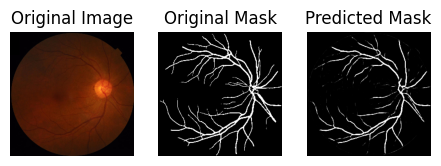

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


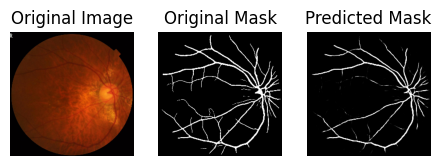

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


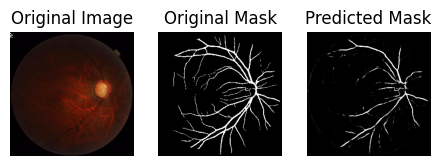

60/60 ━━━━━━━━━━━━━━━━━━━━ 66s 946ms/step - accuracy: 0.9672 - dice_coef: 0.7865 - loss: 0.2972 - val_accuracy: 0.9630 - val_dice_coef: 0.7417 - val_loss: 0.3771
Epoch 11/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 705ms/step - accuracy: 0.9684 - dice_coef: 0.7916 - loss: 0.2894 - val_accuracy: 0.9640 - val_dice_coef: 0.7796 - val_loss: 0.3169
Epoch 12/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 702ms/step - accuracy: 0.9683 - dice_coef: 0.7972 - loss: 0.2828 - val_accuracy: 0.9647 - val_dice_coef: 0.7577 - val_loss: 0.3470
Epoch 13/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 701ms/step - accuracy: 0.9686 - dice_coef: 0.8018 - loss: 0.2769 - val_accuracy: 0.9630 - val_dice_coef: 0.7398 - val_loss: 0.3792
Epoch 14/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 706ms/step - accuracy: 0.9687 - dice_coef: 0.7974 - loss: 0.2816 - val_accuracy: 0.9661 - val_dice_coef: 0.7767 - val_loss: 0.3336
Epoch 15/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 701ms/step - accuracy: 0.9701 - dice_coef: 0.8121 - loss: 0.2624 - val_accuracy: 0.9633 - val_

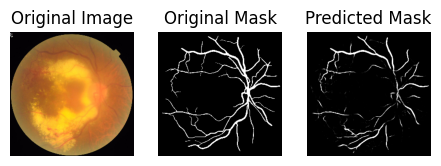

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


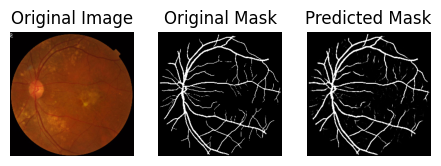

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


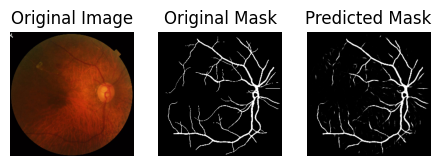

60/60 ━━━━━━━━━━━━━━━━━━━━ 61s 847ms/step - accuracy: 0.9702 - dice_coef: 0.8155 - loss: 0.2596 - val_accuracy: 0.9699 - val_dice_coef: 0.8170 - val_loss: 0.2575
Epoch 21/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 704ms/step - accuracy: 0.9710 - dice_coef: 0.8198 - loss: 0.2527 - val_accuracy: 0.9702 - val_dice_coef: 0.8149 - val_loss: 0.2711
Epoch 22/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 705ms/step - accuracy: 0.9712 - dice_coef: 0.8216 - loss: 0.2499 - val_accuracy: 0.9712 - val_dice_coef: 0.8265 - val_loss: 0.2485
Epoch 23/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 698ms/step - accuracy: 0.9714 - dice_coef: 0.8289 - loss: 0.2412 - val_accuracy: 0.9690 - val_dice_coef: 0.7982 - val_loss: 0.2898
Epoch 24/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 697ms/step - accuracy: 0.9713 - dice_coef: 0.8298 - loss: 0.2403 - val_accuracy: 0.9701 - val_dice_coef: 0.8098 - val_loss: 0.2725
Epoch 25/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 702ms/step - accuracy: 0.9717 - dice_coef: 0.8298 - loss: 0.2388 - val_accuracy: 0.9713 - val_

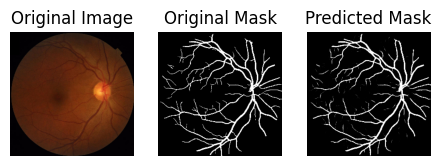

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


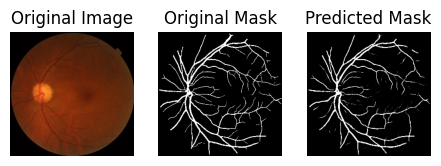

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


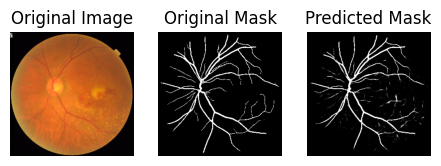

60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 846ms/step - accuracy: 0.9720 - dice_coef: 0.8329 - loss: 0.2361 - val_accuracy: 0.9720 - val_dice_coef: 0.8274 - val_loss: 0.2407
Epoch 31/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 699ms/step - accuracy: 0.9724 - dice_coef: 0.8336 - loss: 0.2340 - val_accuracy: 0.9674 - val_dice_coef: 0.8064 - val_loss: 0.2709
Epoch 32/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 701ms/step - accuracy: 0.9722 - dice_coef: 0.8344 - loss: 0.2333 - val_accuracy: 0.9722 - val_dice_coef: 0.8303 - val_loss: 0.2382
Epoch 33/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 698ms/step - accuracy: 0.9734 - dice_coef: 0.8346 - loss: 0.2310 - val_accuracy: 0.9714 - val_dice_coef: 0.8243 - val_loss: 0.2475
Epoch 34/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 696ms/step - accuracy: 0.9727 - dice_coef: 0.8382 - loss: 0.2294 - val_accuracy: 0.9695 - val_dice_coef: 0.8166 - val_loss: 0.2551
Epoch 35/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 697ms/step - accuracy: 0.9726 - dice_coef: 0.8362 - loss: 0.2321 - val_accuracy: 0.9684 - val_

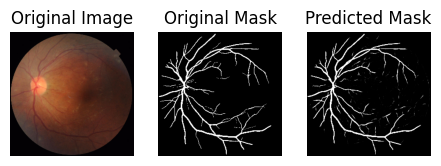

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


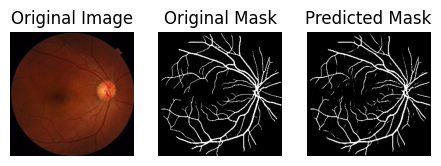

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


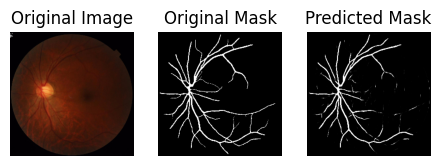

60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 839ms/step - accuracy: 0.9733 - dice_coef: 0.8425 - loss: 0.2225 - val_accuracy: 0.9703 - val_dice_coef: 0.8150 - val_loss: 0.2695
Epoch 41/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 702ms/step - accuracy: 0.9736 - dice_coef: 0.8421 - loss: 0.2215 - val_accuracy: 0.9717 - val_dice_coef: 0.8389 - val_loss: 0.2315
Epoch 42/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 697ms/step - accuracy: 0.9738 - dice_coef: 0.8470 - loss: 0.2152 - val_accuracy: 0.9703 - val_dice_coef: 0.8169 - val_loss: 0.2753
Epoch 43/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 51s 695ms/step - accuracy: 0.9728 - dice_coef: 0.8426 - loss: 0.2262 - val_accuracy: 0.9657 - val_dice_coef: 0.8015 - val_loss: 0.2816
Epoch 44/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 695ms/step - accuracy: 0.9735 - dice_coef: 0.8484 - loss: 0.2156 - val_accuracy: 0.9734 - val_dice_coef: 0.8453 - val_loss: 0.2232
Epoch 45/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 51s 689ms/step - accuracy: 0.9738 - dice_coef: 0.8499 - loss: 0.2139 - val_accuracy: 0.9686 - val_

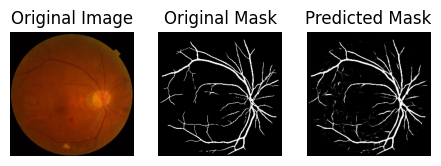

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


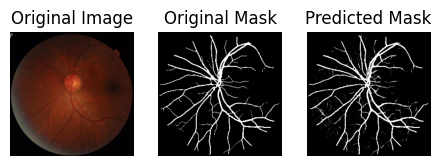

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


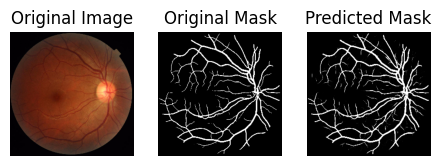

60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 832ms/step - accuracy: 0.9746 - dice_coef: 0.8483 - loss: 0.2142 - val_accuracy: 0.9702 - val_dice_coef: 0.8185 - val_loss: 0.2488
Epoch 51/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 51s 694ms/step - accuracy: 0.9746 - dice_coef: 0.8523 - loss: 0.2092 - val_accuracy: 0.9735 - val_dice_coef: 0.8395 - val_loss: 0.2247
Epoch 52/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 51s 690ms/step - accuracy: 0.9739 - dice_coef: 0.8471 - loss: 0.2183 - val_accuracy: 0.9724 - val_dice_coef: 0.8308 - val_loss: 0.2443
Epoch 53/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 698ms/step - accuracy: 0.9739 - dice_coef: 0.8496 - loss: 0.2161 - val_accuracy: 0.9708 - val_dice_coef: 0.8136 - val_loss: 0.2690
Epoch 54/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 696ms/step - accuracy: 0.9750 - dice_coef: 0.8529 - loss: 0.2075 - val_accuracy: 0.9670 - val_dice_coef: 0.7844 - val_loss: 0.3277
Epoch 55/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 702ms/step - accuracy: 0.9748 - dice_coef: 0.8539 - loss: 0.2067 - val_accuracy: 0.9739 - val_

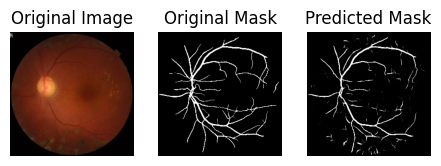

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


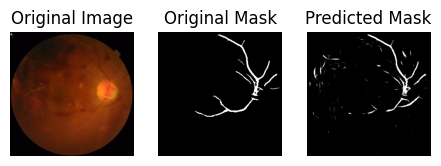

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


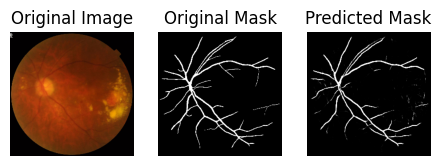

60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 839ms/step - accuracy: 0.9748 - dice_coef: 0.8572 - loss: 0.2036 - val_accuracy: 0.9735 - val_dice_coef: 0.8475 - val_loss: 0.2197
Epoch 61/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 696ms/step - accuracy: 0.9747 - dice_coef: 0.8572 - loss: 0.2035 - val_accuracy: 0.9683 - val_dice_coef: 0.8173 - val_loss: 0.2594
Epoch 62/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 696ms/step - accuracy: 0.9750 - dice_coef: 0.8566 - loss: 0.2044 - val_accuracy: 0.9729 - val_dice_coef: 0.8448 - val_loss: 0.2220
Epoch 63/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 697ms/step - accuracy: 0.9743 - dice_coef: 0.8506 - loss: 0.2146 - val_accuracy: 0.9739 - val_dice_coef: 0.8526 - val_loss: 0.2102
Epoch 64/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 701ms/step - accuracy: 0.9748 - dice_coef: 0.8543 - loss: 0.2070 - val_accuracy: 0.9743 - val_dice_coef: 0.8498 - val_loss: 0.2158
Epoch 65/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 698ms/step - accuracy: 0.9752 - dice_coef: 0.8593 - loss: 0.2000 - val_accuracy: 0.9725 - val_

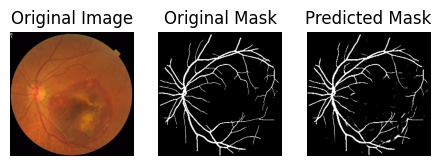

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


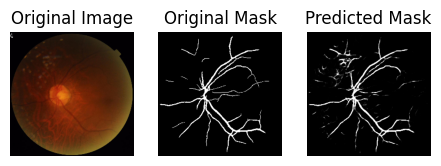

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


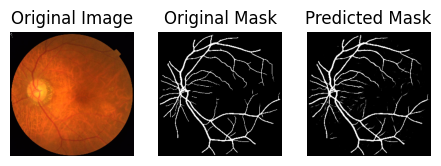

60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 840ms/step - accuracy: 0.9747 - dice_coef: 0.8561 - loss: 0.2054 - val_accuracy: 0.9738 - val_dice_coef: 0.8501 - val_loss: 0.2129
Epoch 71/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 704ms/step - accuracy: 0.9755 - dice_coef: 0.8628 - loss: 0.1945 - val_accuracy: 0.9744 - val_dice_coef: 0.8554 - val_loss: 0.2100
Epoch 72/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 696ms/step - accuracy: 0.9751 - dice_coef: 0.8623 - loss: 0.1962 - val_accuracy: 0.9732 - val_dice_coef: 0.8339 - val_loss: 0.2260
Epoch 73/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 700ms/step - accuracy: 0.9750 - dice_coef: 0.8587 - loss: 0.2014 - val_accuracy: 0.9713 - val_dice_coef: 0.8232 - val_loss: 0.2672
Epoch 74/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 703ms/step - accuracy: 0.9758 - dice_coef: 0.8623 - loss: 0.1948 - val_accuracy: 0.9749 - val_dice_coef: 0.8559 - val_loss: 0.2063
Epoch 75/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 696ms/step - accuracy: 0.9750 - dice_coef: 0.8588 - loss: 0.2010 - val_accuracy: 0.9748 - val_

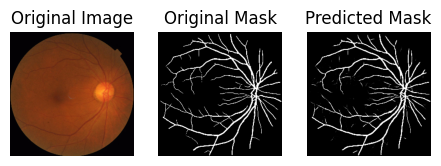

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


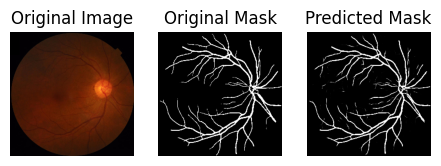

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


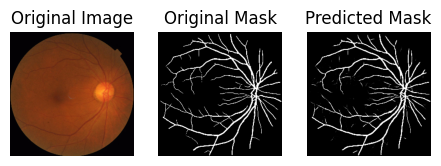

60/60 ━━━━━━━━━━━━━━━━━━━━ 61s 845ms/step - accuracy: 0.9753 - dice_coef: 0.8618 - loss: 0.1982 - val_accuracy: 0.9746 - val_dice_coef: 0.8529 - val_loss: 0.2126
Epoch 81/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 696ms/step - accuracy: 0.9755 - dice_coef: 0.8626 - loss: 0.1960 - val_accuracy: 0.9731 - val_dice_coef: 0.8477 - val_loss: 0.2232
Epoch 82/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 701ms/step - accuracy: 0.9754 - dice_coef: 0.8590 - loss: 0.2002 - val_accuracy: 0.9749 - val_dice_coef: 0.8589 - val_loss: 0.2059
Epoch 83/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 698ms/step - accuracy: 0.9756 - dice_coef: 0.8624 - loss: 0.1963 - val_accuracy: 0.9670 - val_dice_coef: 0.8147 - val_loss: 0.2699
Epoch 84/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 697ms/step - accuracy: 0.9753 - dice_coef: 0.8586 - loss: 0.2029 - val_accuracy: 0.9718 - val_dice_coef: 0.8265 - val_loss: 0.2575
Epoch 85/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 699ms/step - accuracy: 0.9755 - dice_coef: 0.8620 - loss: 0.1972 - val_accuracy: 0.9741 - val_

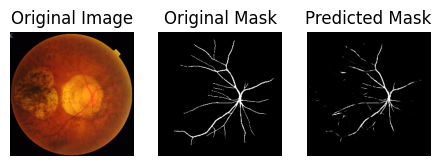

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


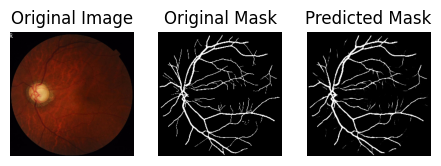

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


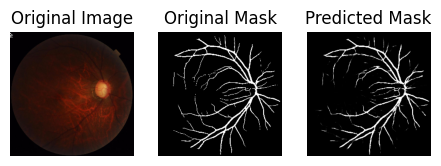

60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 840ms/step - accuracy: 0.9752 - dice_coef: 0.8620 - loss: 0.1994 - val_accuracy: 0.9743 - val_dice_coef: 0.8527 - val_loss: 0.2133
Epoch 91/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 697ms/step - accuracy: 0.9761 - dice_coef: 0.8660 - loss: 0.1903 - val_accuracy: 0.9739 - val_dice_coef: 0.8531 - val_loss: 0.2135
Epoch 92/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 51s 697ms/step - accuracy: 0.9757 - dice_coef: 0.8644 - loss: 0.1936 - val_accuracy: 0.9732 - val_dice_coef: 0.8415 - val_loss: 0.2318
Epoch 93/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 700ms/step - accuracy: 0.9756 - dice_coef: 0.8608 - loss: 0.1997 - val_accuracy: 0.9727 - val_dice_coef: 0.8451 - val_loss: 0.2198
Epoch 94/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 698ms/step - accuracy: 0.9759 - dice_coef: 0.8663 - loss: 0.1908 - val_accuracy: 0.9722 - val_dice_coef: 0.8376 - val_loss: 0.2270
Epoch 95/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 52s 701ms/step - accuracy: 0.9756 - dice_coef: 0.8641 - loss: 0.1955 - val_accuracy: 0.9752 - val_

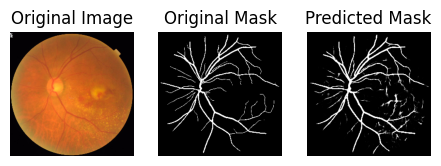

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


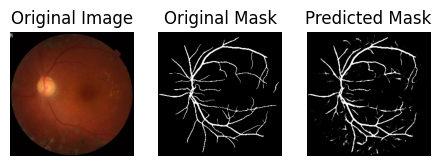

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


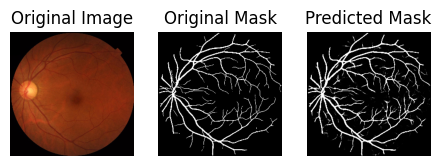

60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 844ms/step - accuracy: 0.9761 - dice_coef: 0.8664 - loss: 0.1912 - val_accuracy: 0.9683 - val_dice_coef: 0.8264 - val_loss: 0.2582


In [7]:

import tensorflow.keras.backend as K

checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/FIVES A Fundus/model_swin_transformer.keras',
    monitor='val_accuracy',
    # custom_objects={'ConvBlock': ConvBlock, 'PatchMerging': PatchMerging,
    #                 'Patches': Patches, 'PatchEmbedding': PatchEmbedding,
    #                 'SwinTransformer': SwinTransformer, 'WindowAttention': WindowAttention },
    verbose=0,
    save_best_only=True,
    save_weights_only=False,
    mode='auto',
)
class ShowProgress(Callback):
    def on_epoch_end(self, epoch, logs=None):
        if (epoch+1)%10==0:
            show_images(val_dataset, model=self.model, explain=True, n_images=3, SIZE=(15,8))

history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    callbacks=[checkpoint,  ShowProgress()],
    epochs=100
)

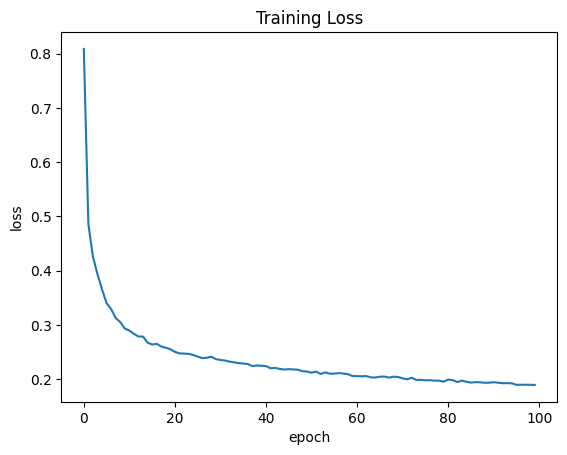

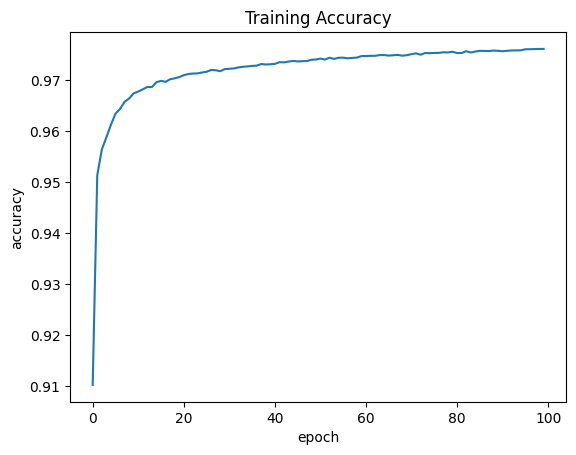

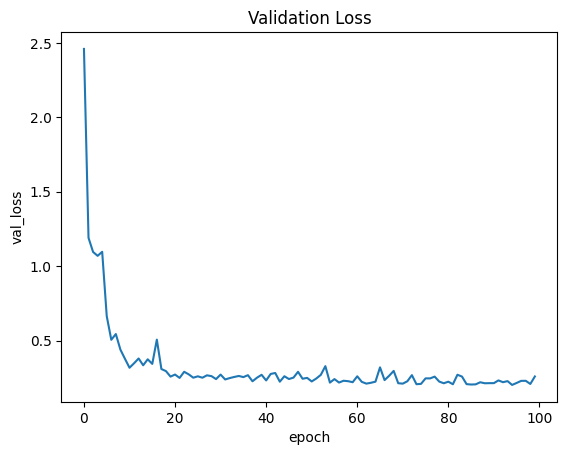

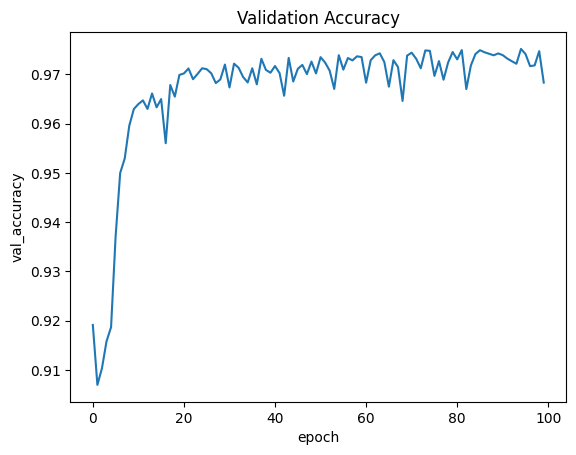

In [8]:
plt.plot(history.history["loss"])
plt.title("Training Loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()

plt.plot(history.history["accuracy"])
plt.title("Training Accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.show()

plt.plot(history.history["val_loss"])
plt.title("Validation Loss")
plt.ylabel("val_loss")
plt.xlabel("epoch")
plt.show()

plt.plot(history.history["val_accuracy"])
plt.title("Validation Accuracy")
plt.ylabel("val_accuracy")
plt.xlabel("epoch")
plt.show()

In [10]:
m1 = keras.models.load_model("/content/drive/MyDrive/FIVES A Fundus/model_swin_transformer.keras", custom_objects={'dice_coef': dice_coef})
dice_score = m1.evaluate(val_dataset, verbose=0)
print("Val Dice Score:", dice_score[1])

Val Dice Score: 0.8564998507499695


In [11]:
import tensorflow as tf

IMAGE_SIZE = 256
BATCH_SIZE = 8

def read_image(image_path, mask=False):
    image = tf.io.read_file(image_path)

    if mask:
        image = tf.image.decode_png(image, channels=1)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1] for mask images
        image = tf.where(image >= 0.5, 1.0, 0.0)
        image = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])
    else:
        image = tf.image.decode_png(image, channels=3)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1] for RGB images

        image = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])

    return image

def load_data(image_list, mask_list):
    image = read_image(image_list)
    mask = read_image(mask_list, mask=True)
    return image, mask

def data_generator(image_list, mask_list):
    dataset = tf.data.Dataset.from_tensor_slices((image_list, mask_list))
    dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    return dataset

test_dataset = data_generator(test_image_paths, test_mask_paths)

print("Test Dataset:", test_dataset)


Test Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(8, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(8, 256, 256, 1), dtype=tf.float32, name=None))>


In [14]:

def calculate_metrics(model, test_dataset):
    accuracy_scores = []
    dice_scores = []
    tp_scores = []
    tn_scores = []
    fp_scores = []
    fn_scores = []

    for image, mask in test_dataset:

        pred_mask = model.predict(image)


        mask = mask.numpy()

        pred_mask_binary = (pred_mask > 0.5).astype(np.float32)

        mask_flat = mask.flatten()
        pred_mask_flat = pred_mask_binary.flatten()

        # Calculate True Positives, True Negatives, False Positives, and False Negatives
        tp = np.sum(mask_flat * pred_mask_flat)
        tn = np.sum((1 - mask_flat) * (1 - pred_mask_flat))
        fp = np.sum((1 - mask_flat) * pred_mask_flat)
        fn = np.sum(mask_flat * (1 - pred_mask_flat))

        # Calculate accuracy, Dice score
        accuracy = (tp + tn) / (tp + tn + fp + fn)
        dice = (2.0 * tp) / (2.0 * tp + fp + fn)

        accuracy_scores.append(accuracy)
        dice_scores.append(dice)
        tp_scores.append(tp)
        tn_scores.append(tn)
        fp_scores.append(fp)
        fn_scores.append(fn)

    # Calculate and print average accuracy and Dice scores
    avg_accuracy = np.mean(accuracy_scores)
    avg_dice = np.mean(dice_scores)

    print(f"Average Accuracy: {avg_accuracy:.4f}")
    print(f"Average Dice Score: {avg_dice:.4f}")

    TP = np.mean(tp_scores)
    TN = np.mean(tn_scores)
    FP = np.mean(fp_scores)
    FN = np.mean(fn_scores)

    f1 = 2 * TP / (2 * TP + FP + FN)
    recall = TP/(FN+TP)
    precision = TP/(TP+FP)
    specificity = TN/(FP+TN)
    MCC = (TP*TN - FP*FN)/ np.sqrt((TP+FP)*(TP+FN)*(TN+FP)*(TN+FN))

    print("Precision Score:", precision)
    print("Sensitivity/Recall Score:", recall)
    print("Specificity Score:", specificity)
    print("F1 Score:", f1)
    print("MCC :", MCC)

calculate_metrics(m1, test_dataset)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Average Accuracy: 0.9806
Average Dice Score: 0.8

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


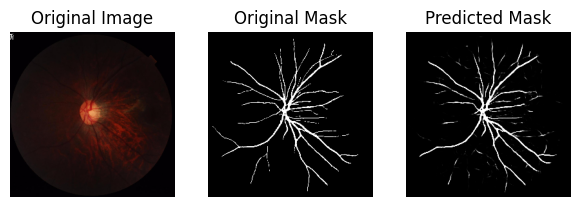

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


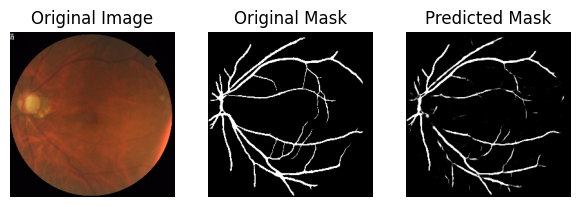

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


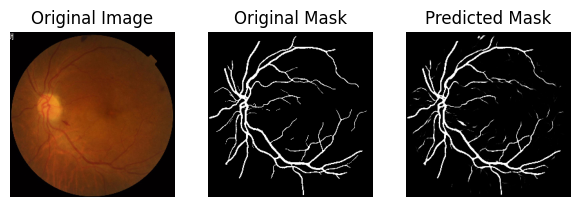

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


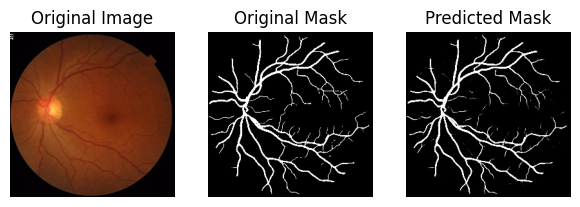

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


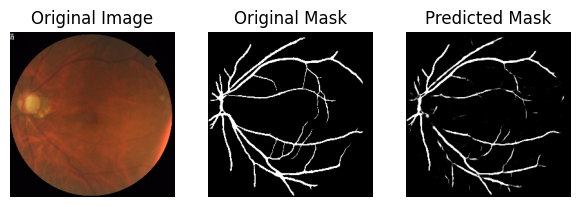

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


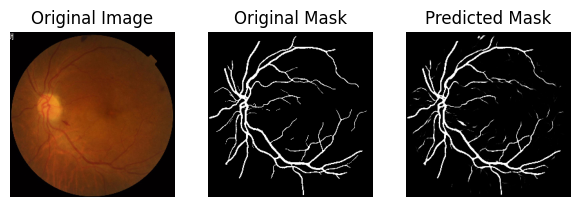

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


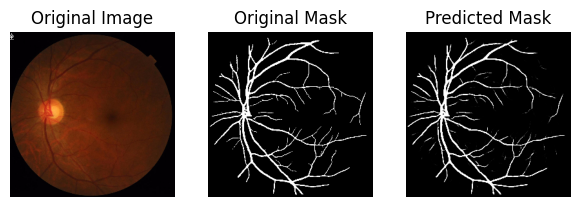

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


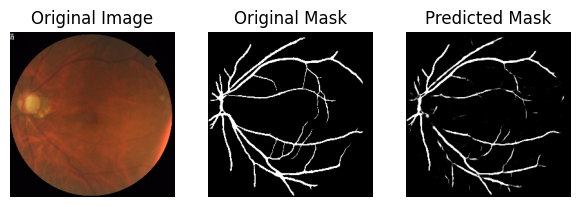

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


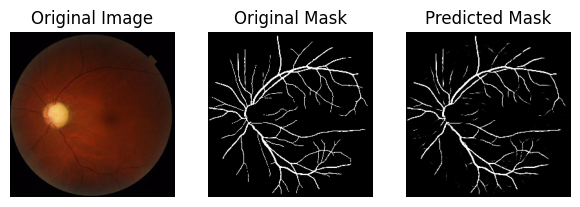

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


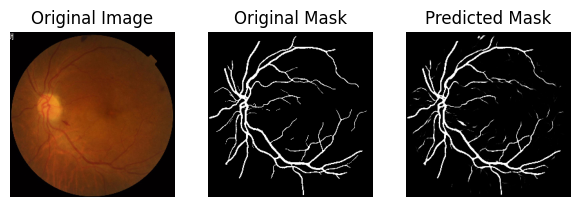

In [15]:
show_images(test_dataset, model=m1, explain=True, n_images=10, SIZE=(20,8))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


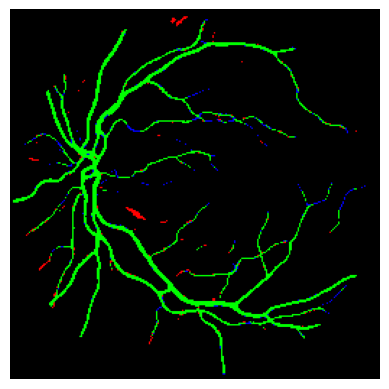

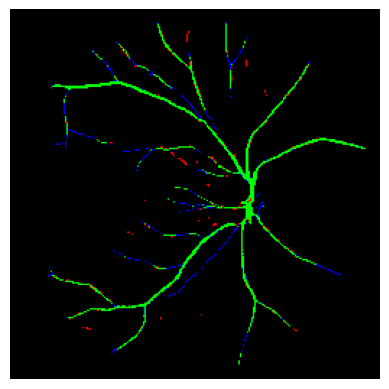

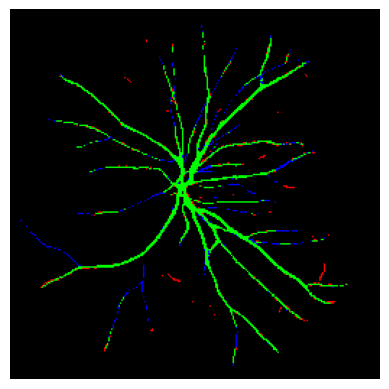

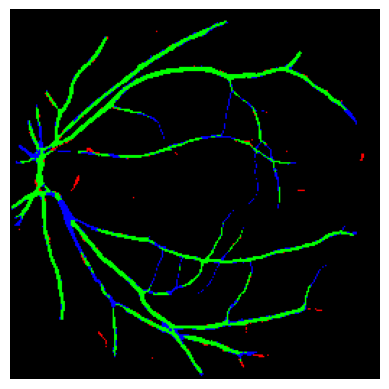

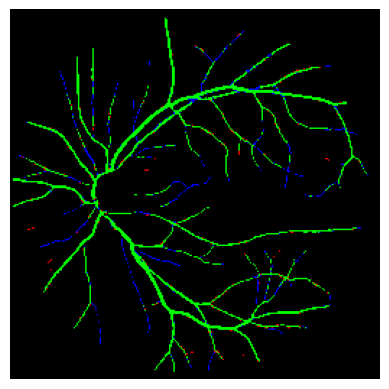

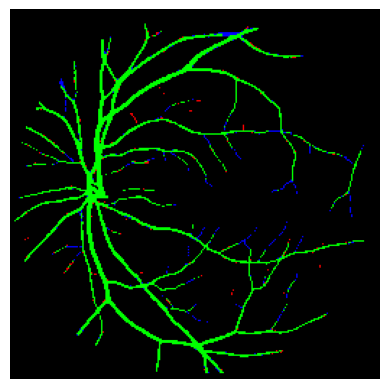

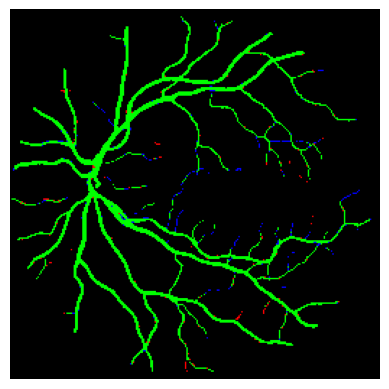

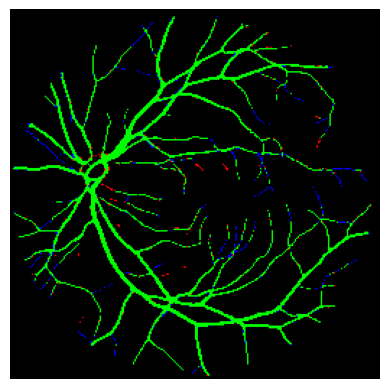

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


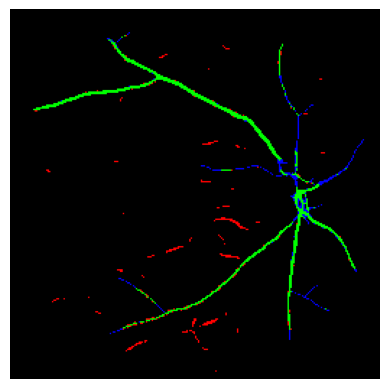

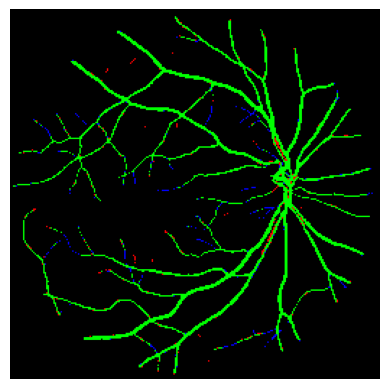

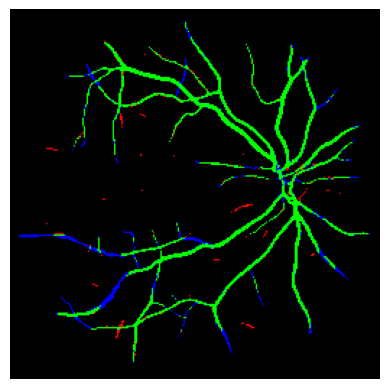

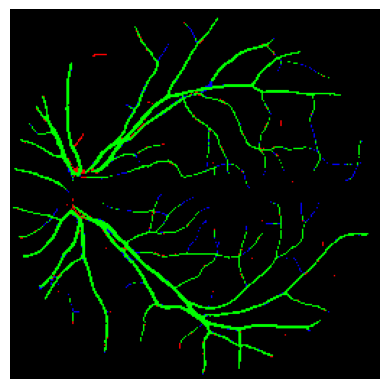

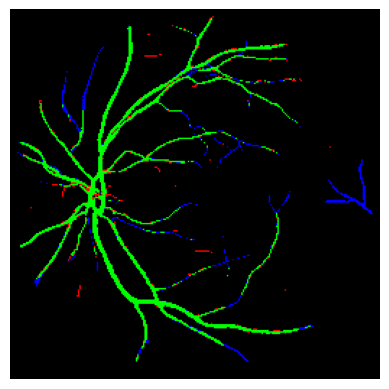

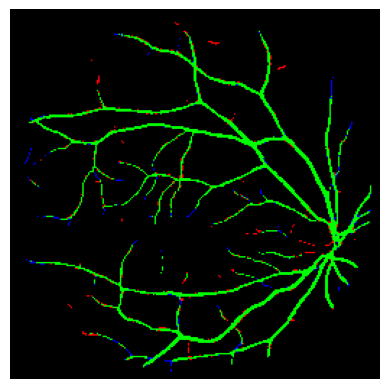

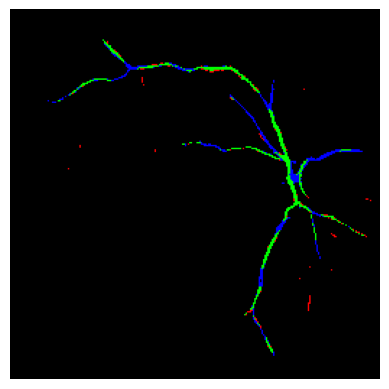

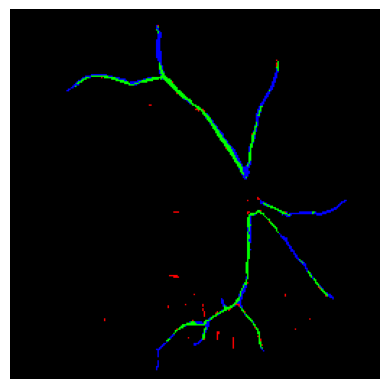

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


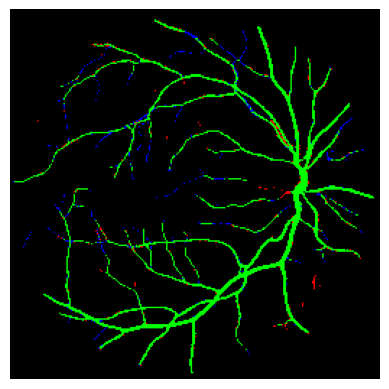

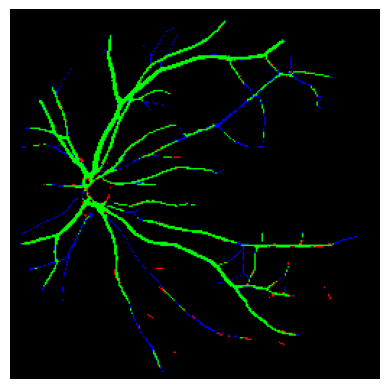

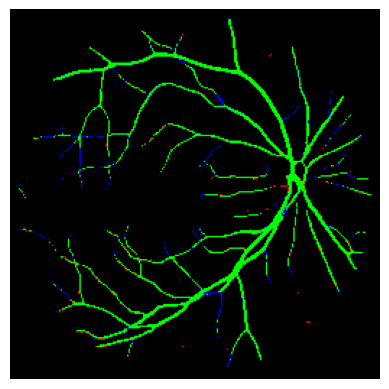

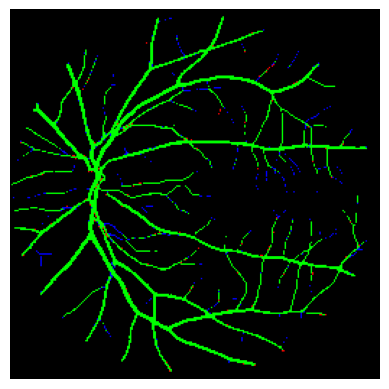

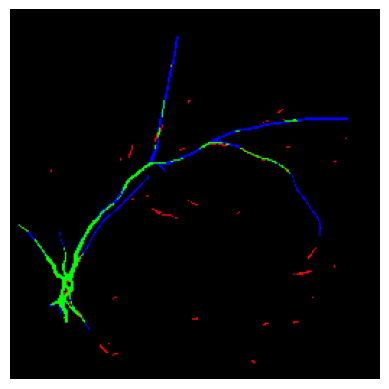

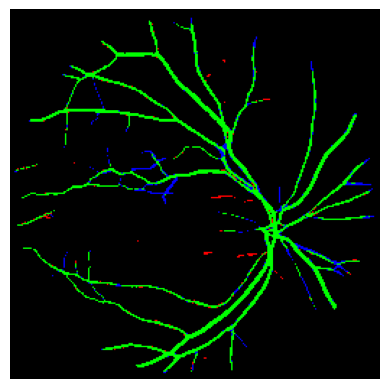

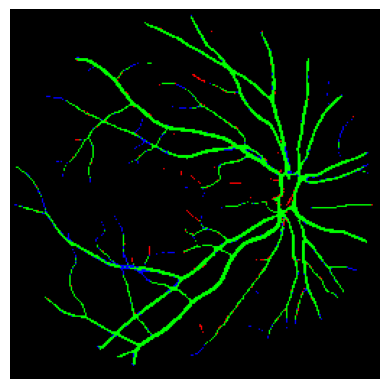

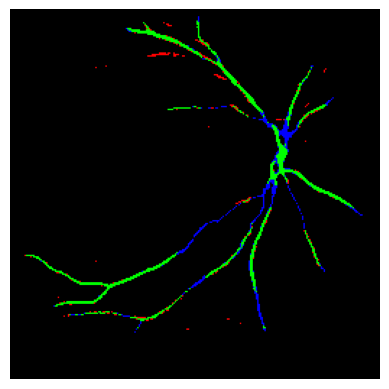

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


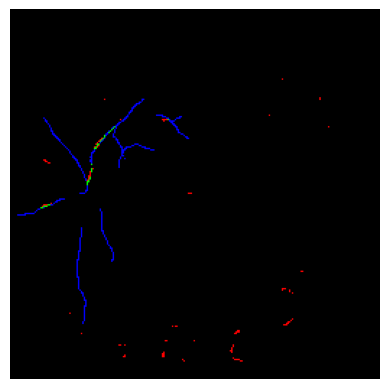

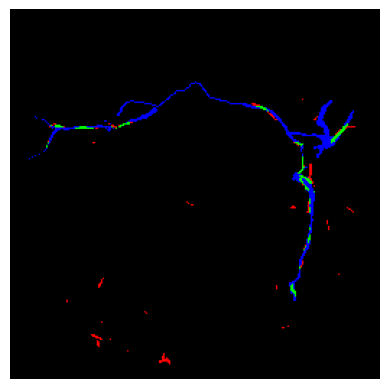

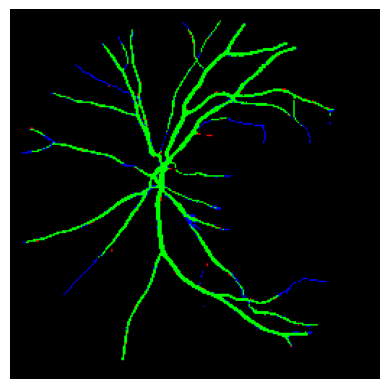

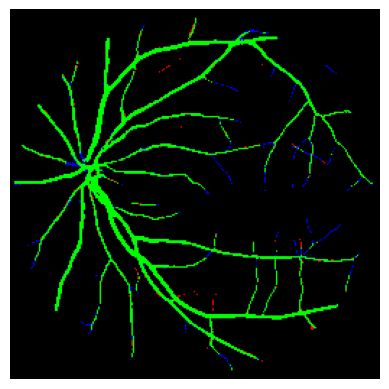

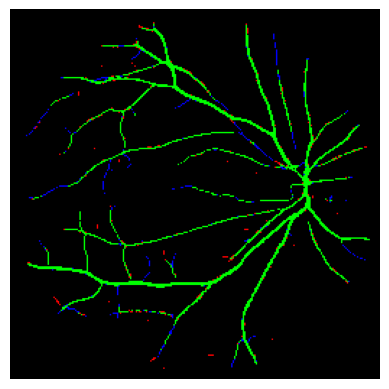

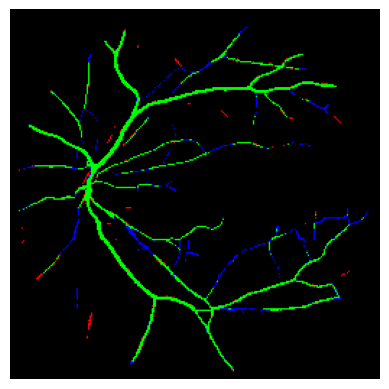

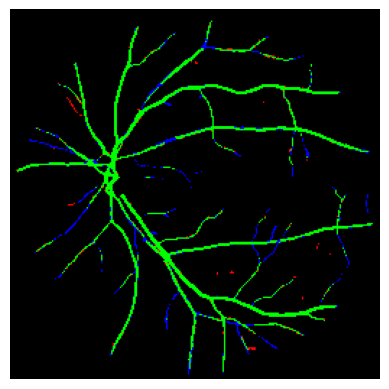

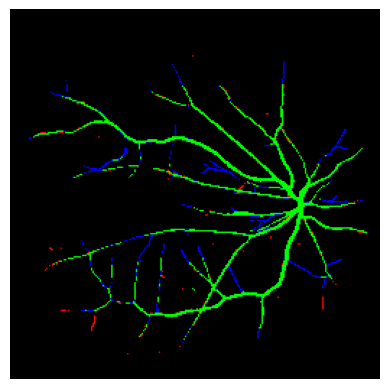

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


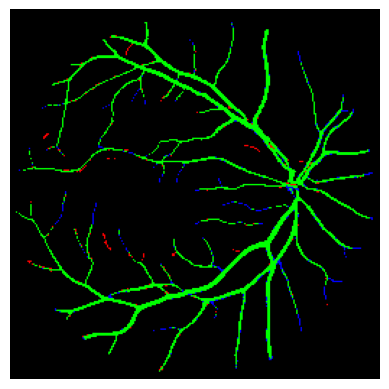

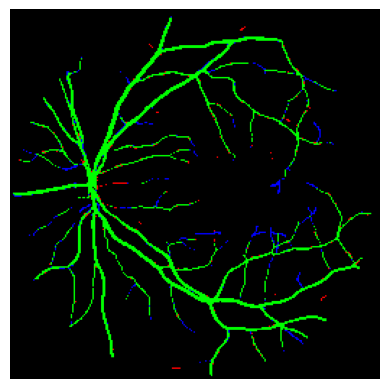

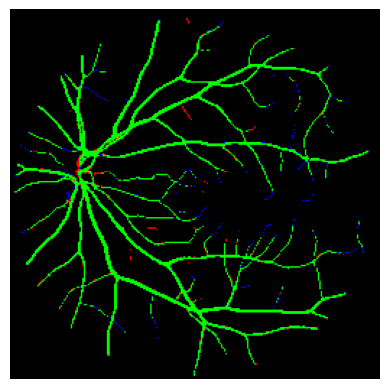

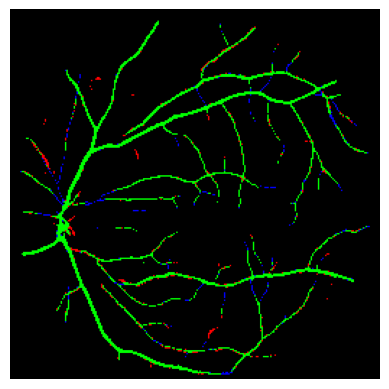

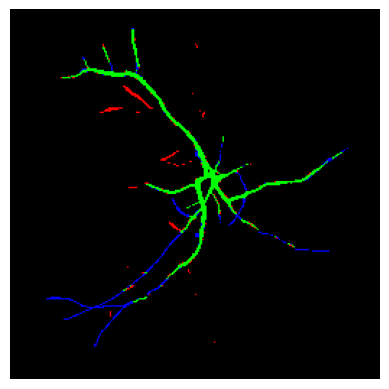

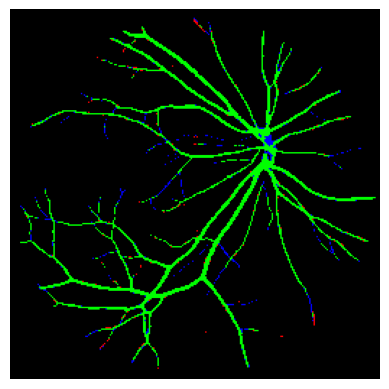

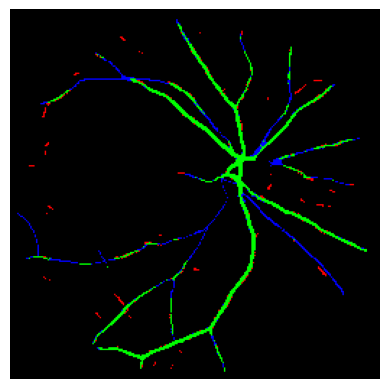

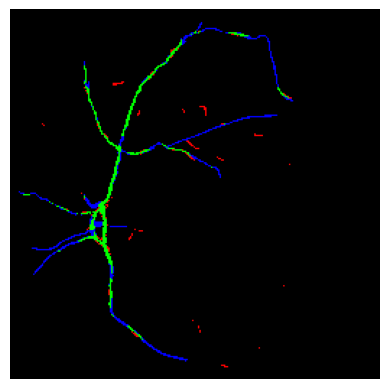

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


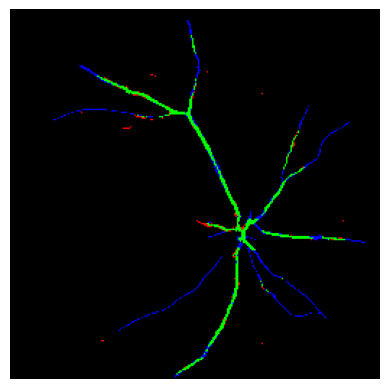

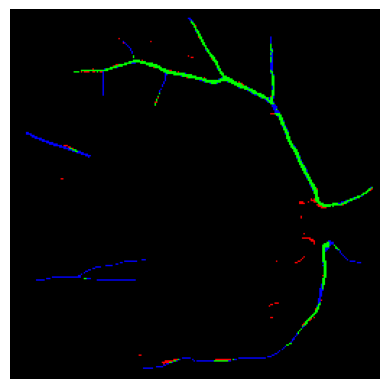

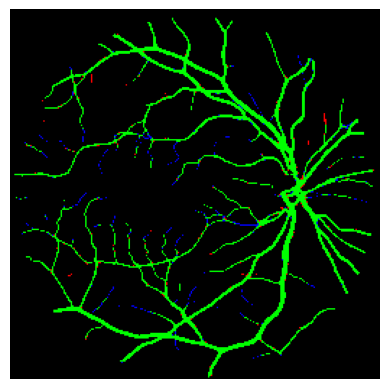

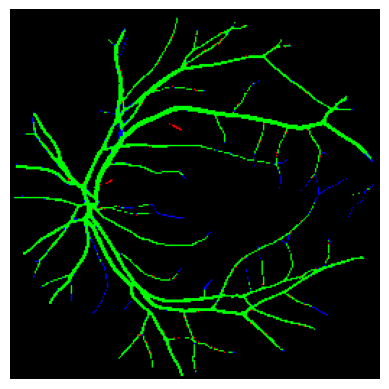

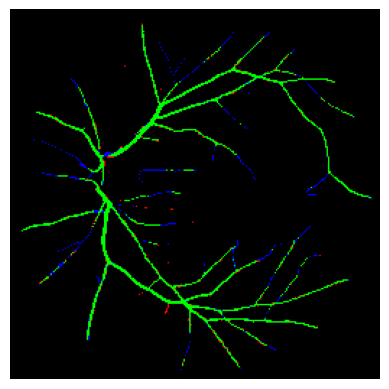

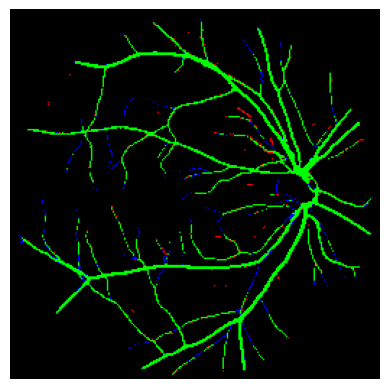

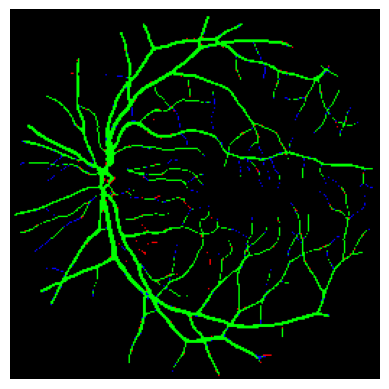

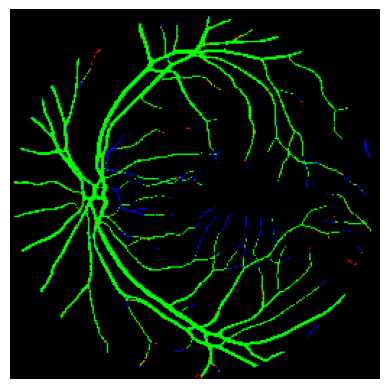

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


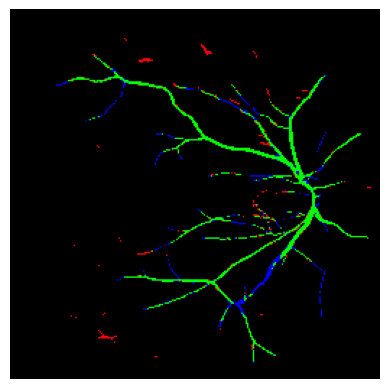

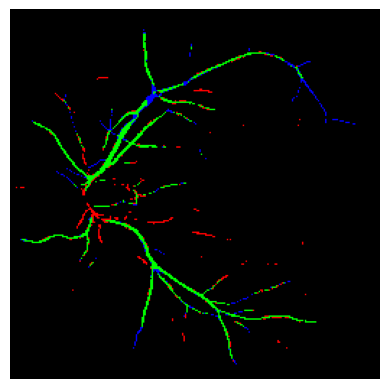

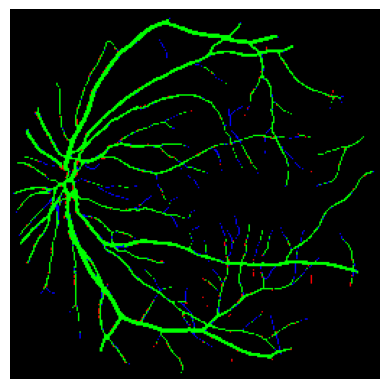

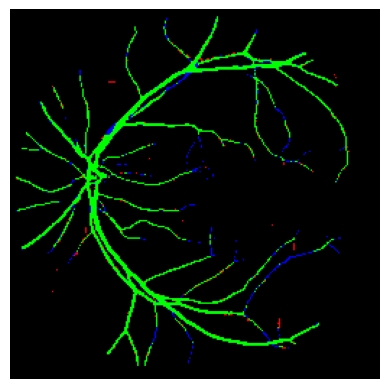

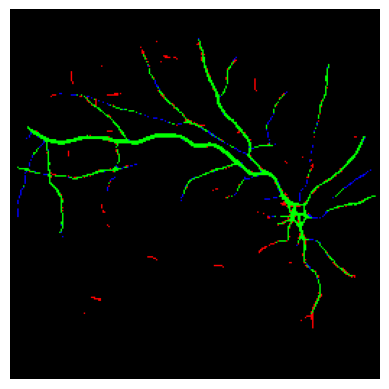

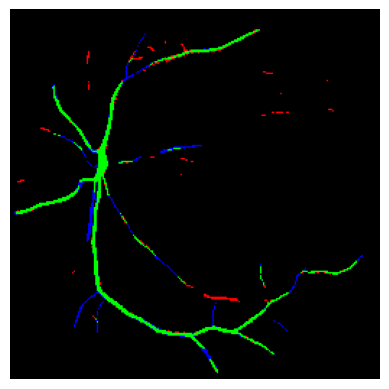

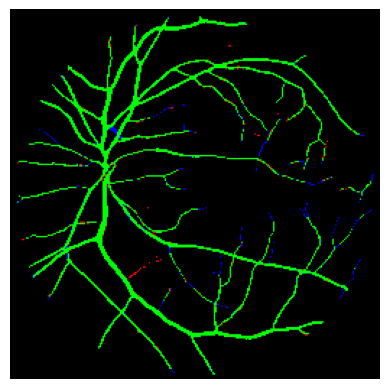

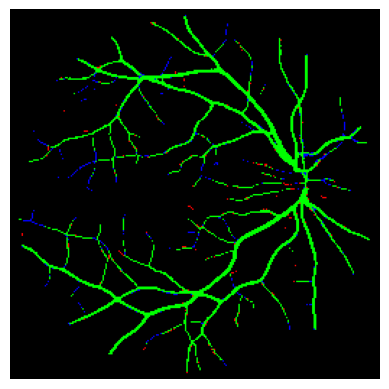

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


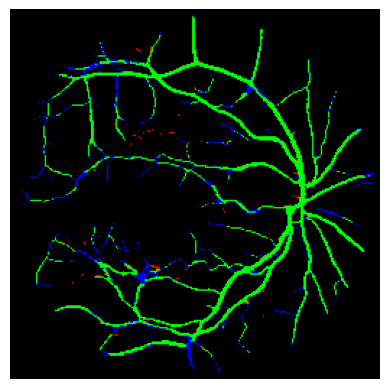

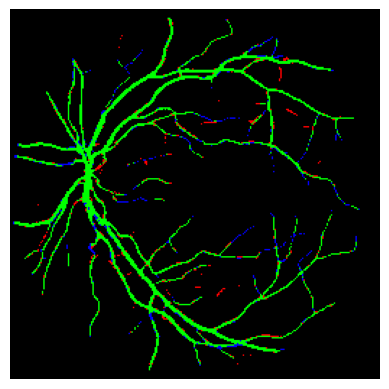

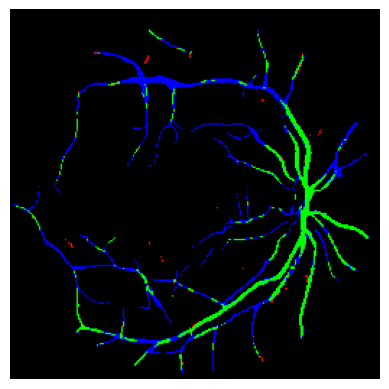

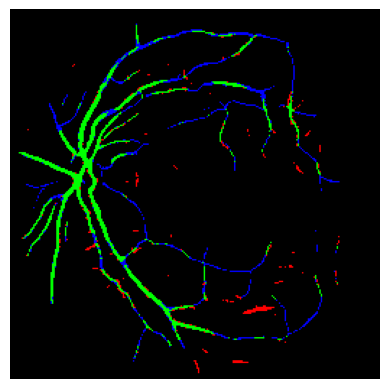

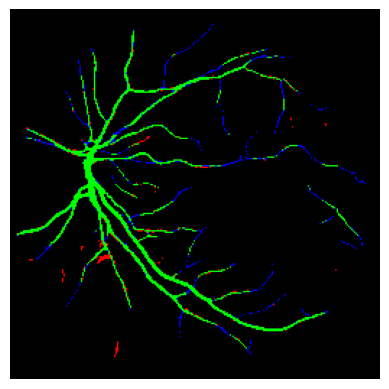

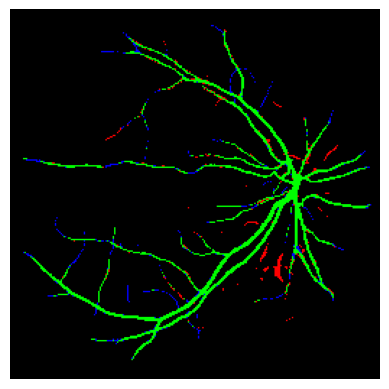

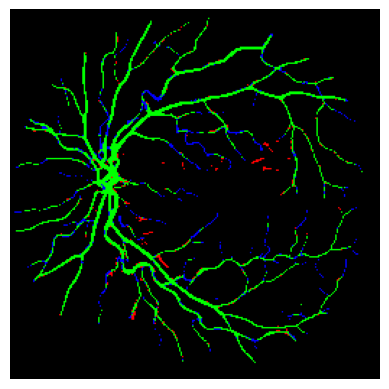

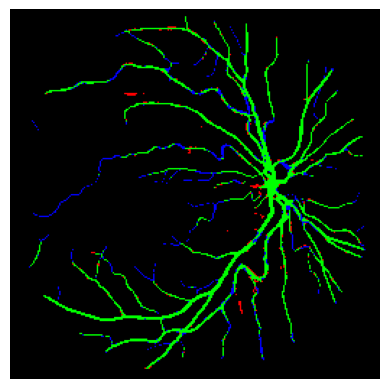

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


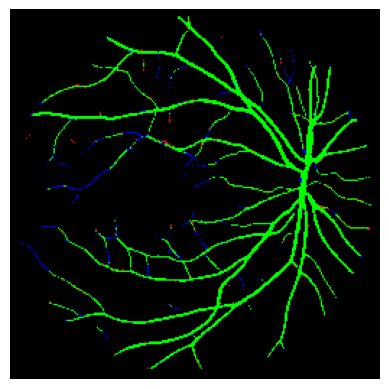

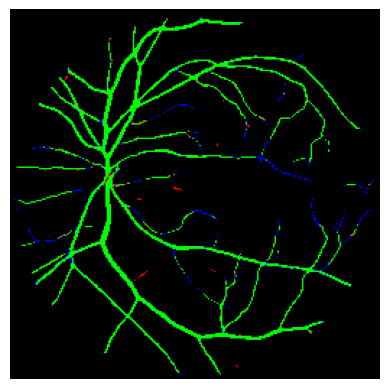

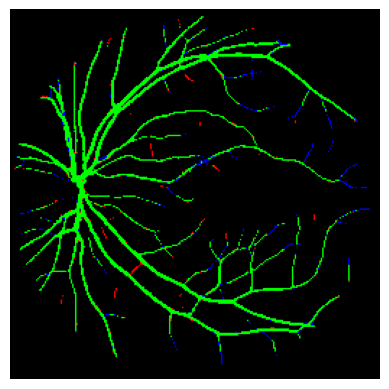

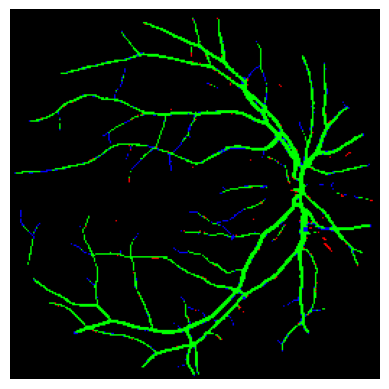

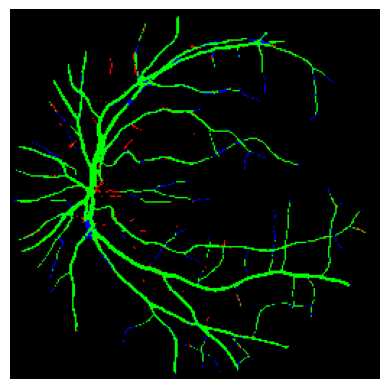

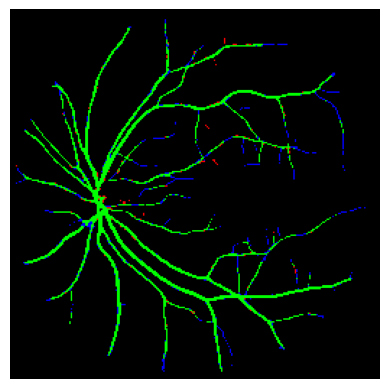

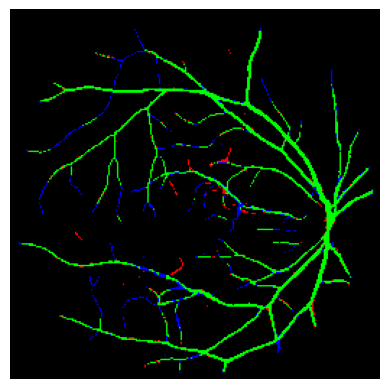

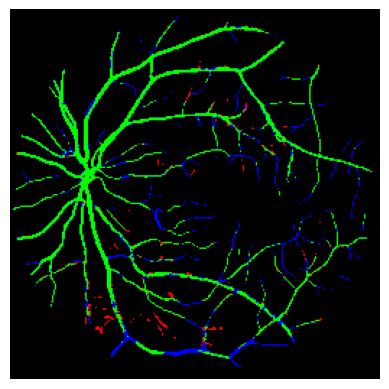

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


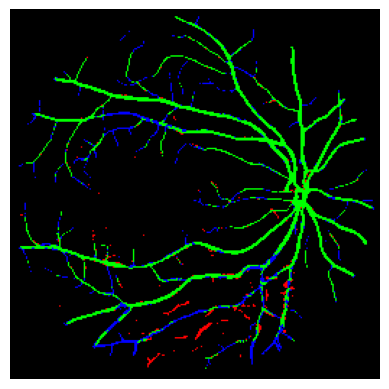

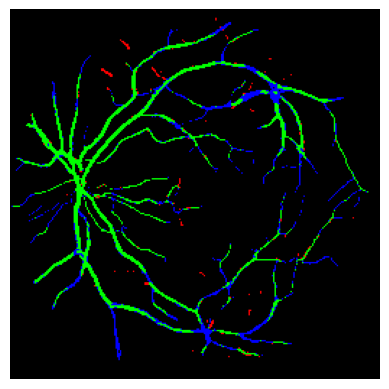

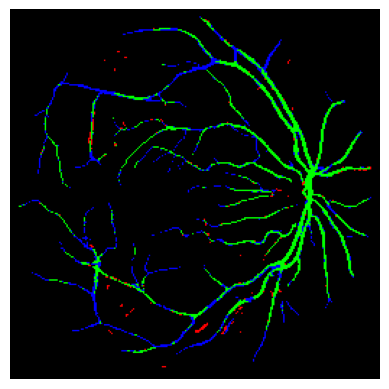

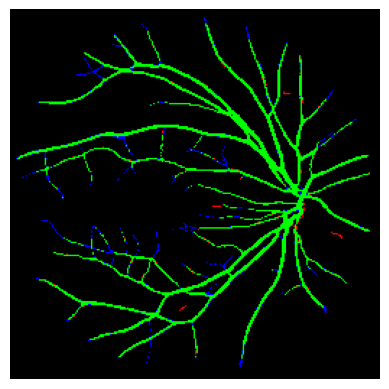

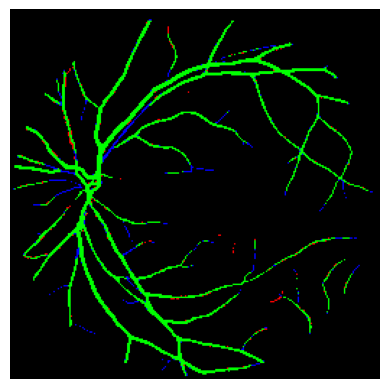

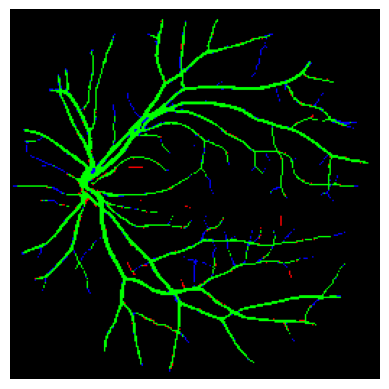

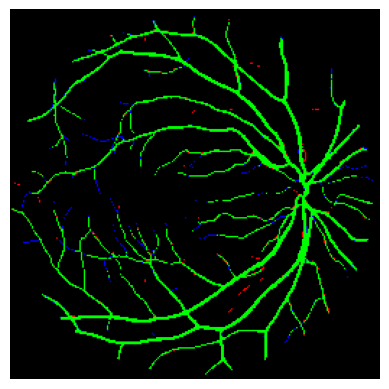

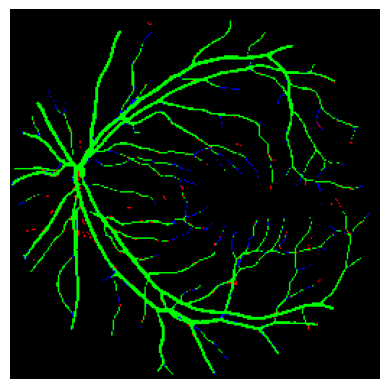

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


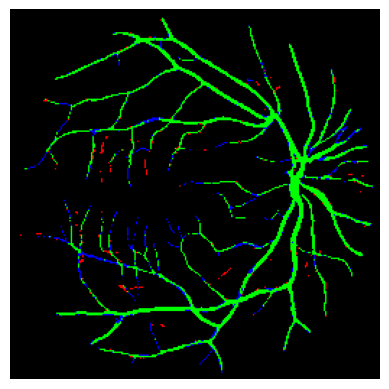

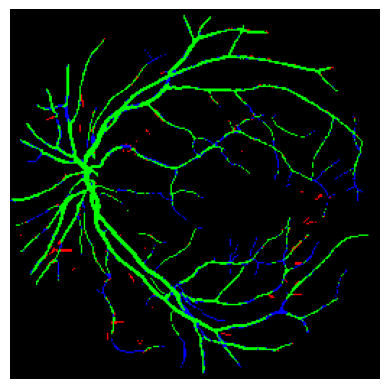

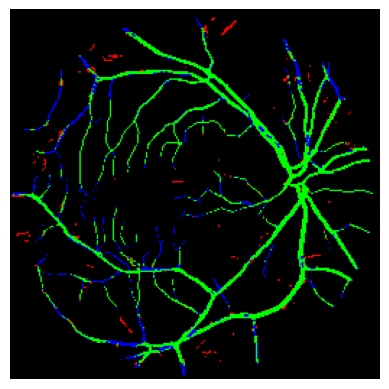

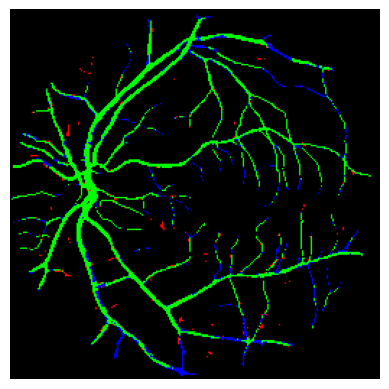

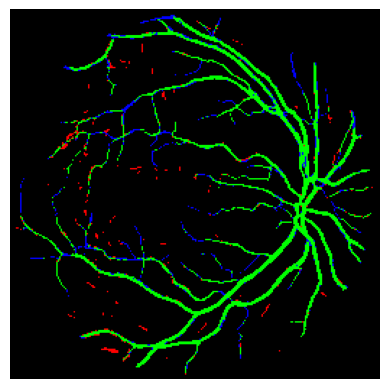

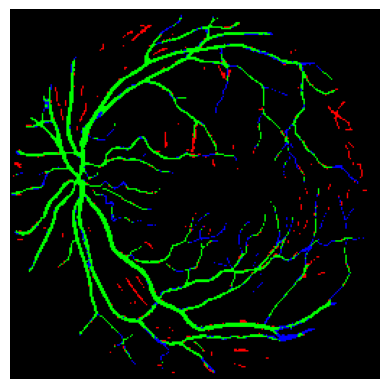

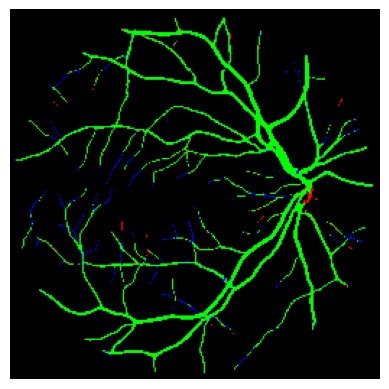

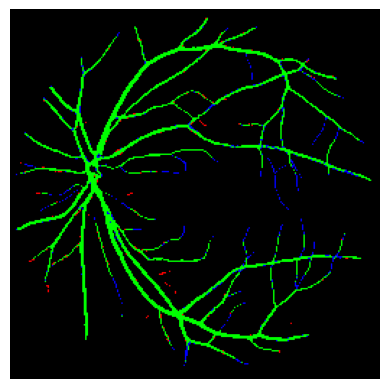

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


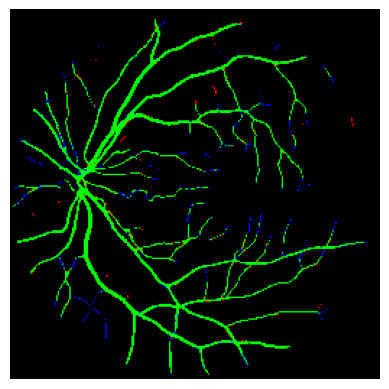

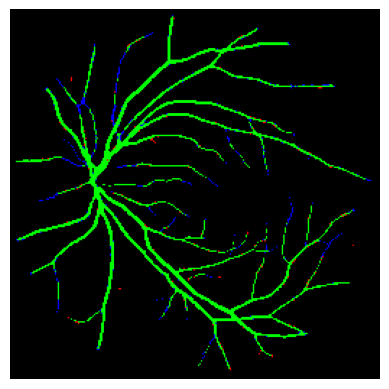

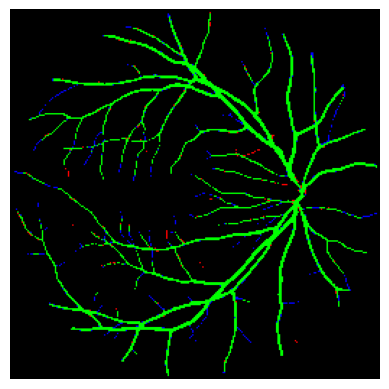

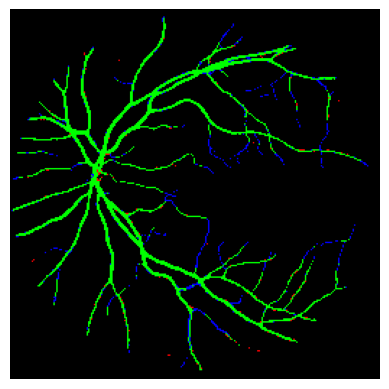

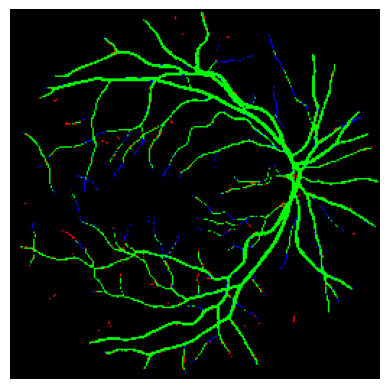

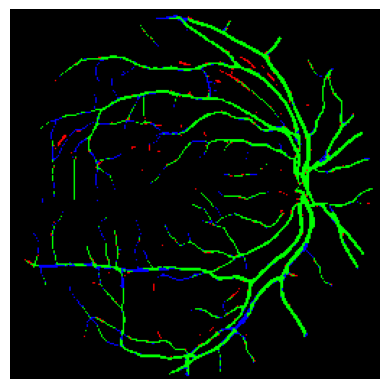

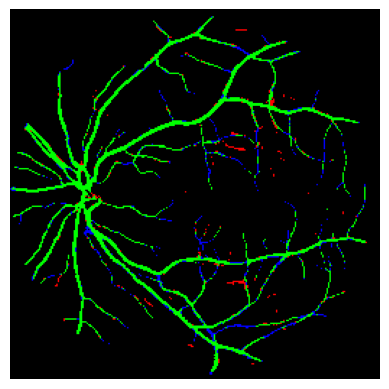

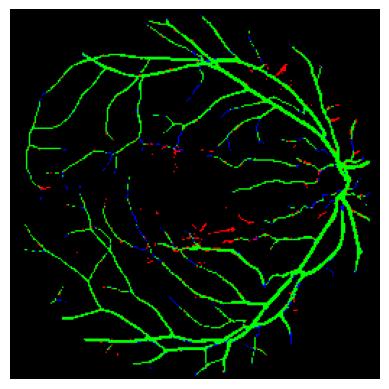

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


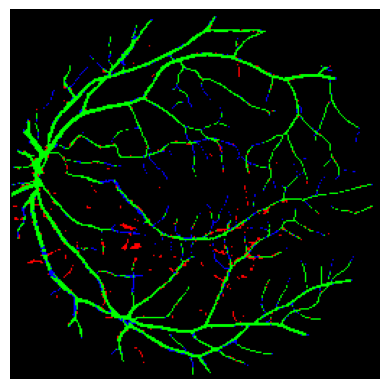

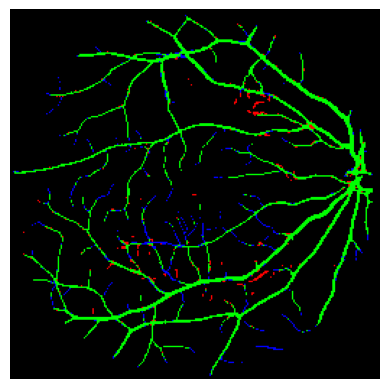

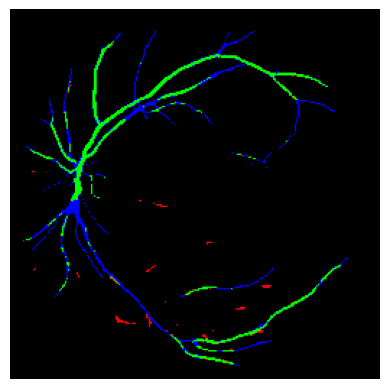

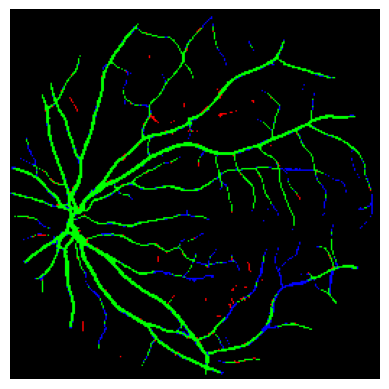

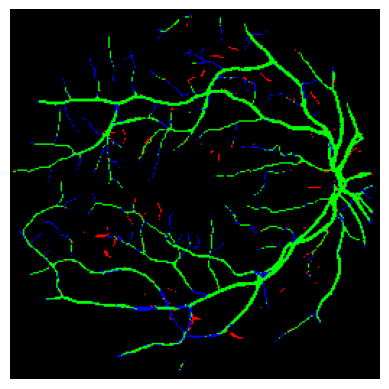

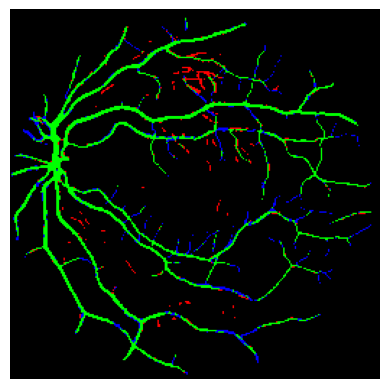

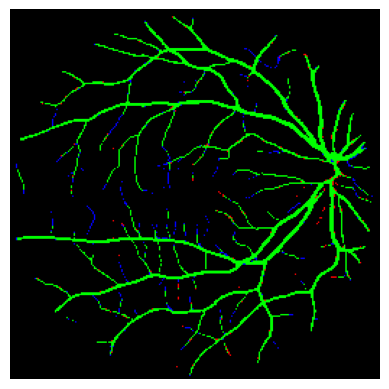

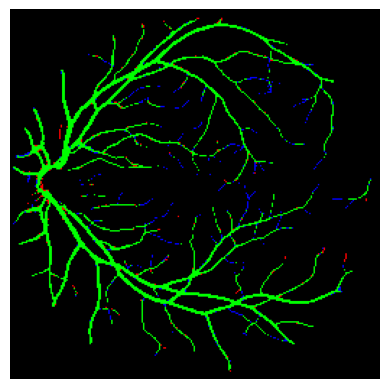

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


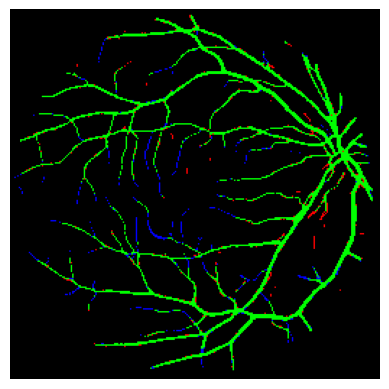

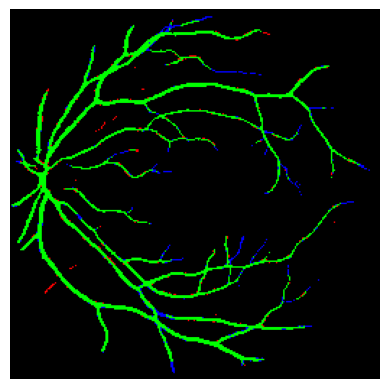

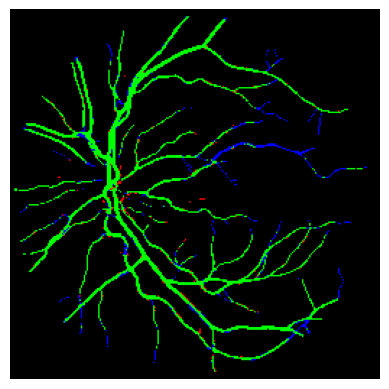

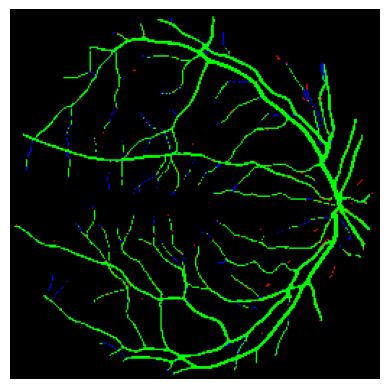

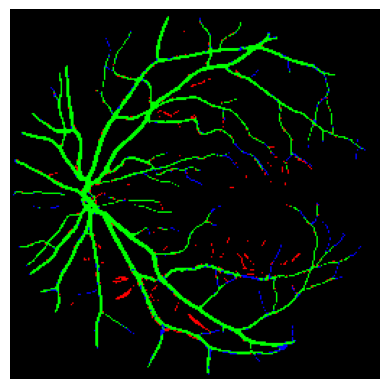

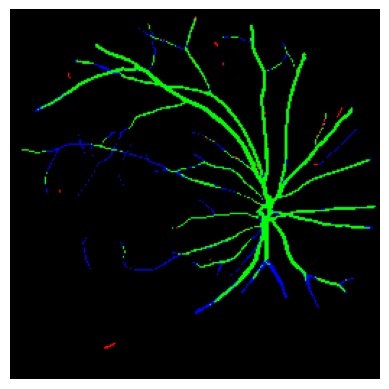

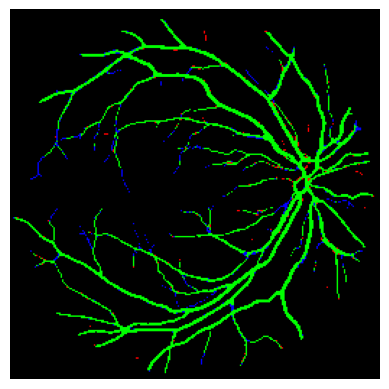

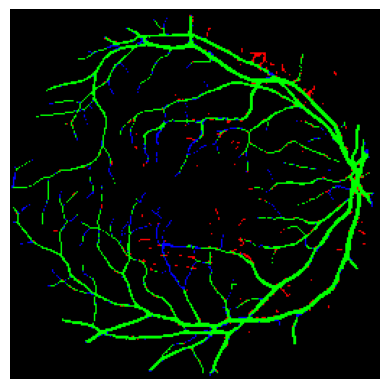

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


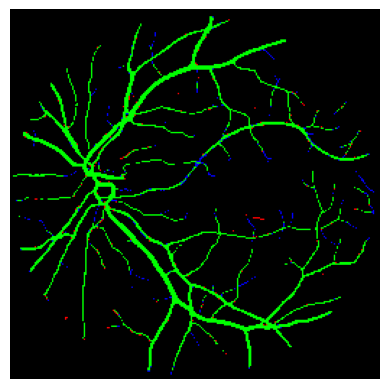

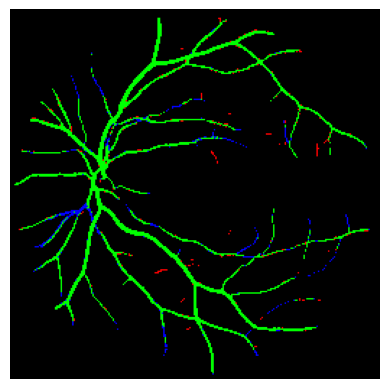

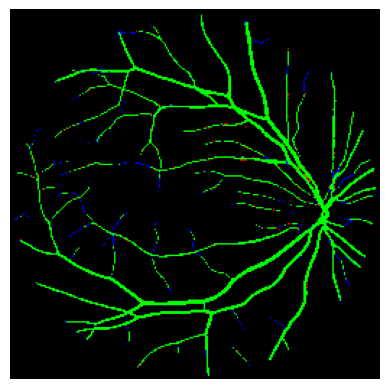

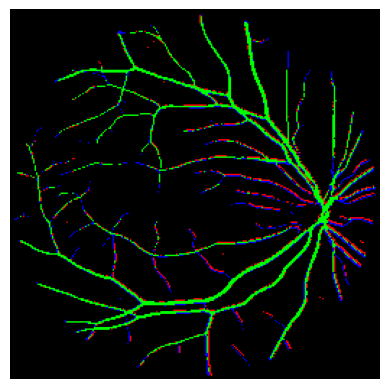

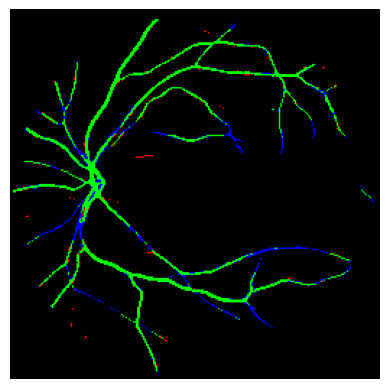

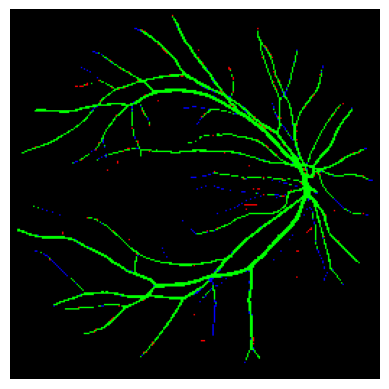

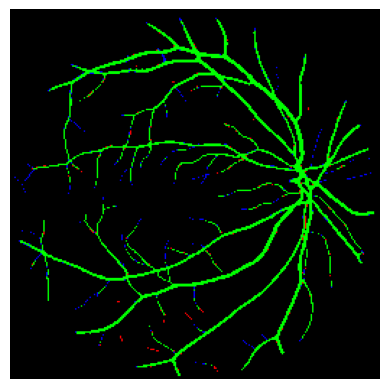

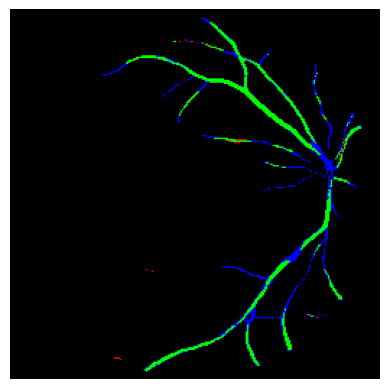

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


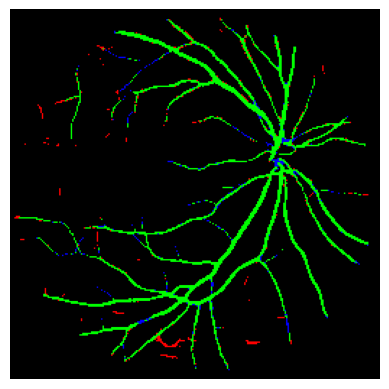

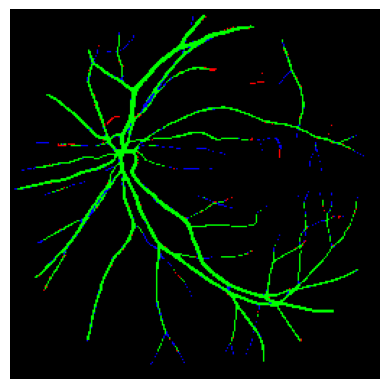

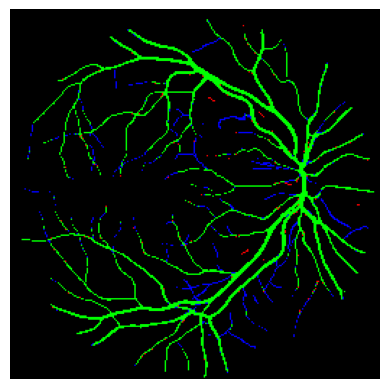

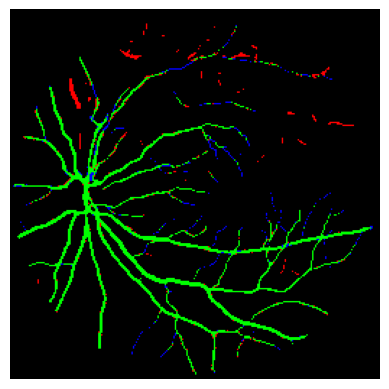

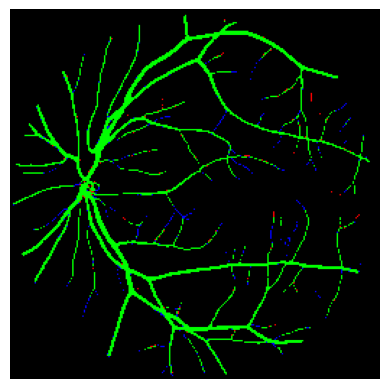

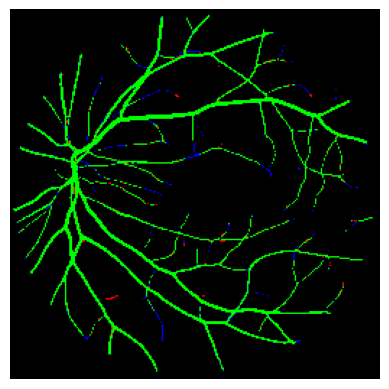

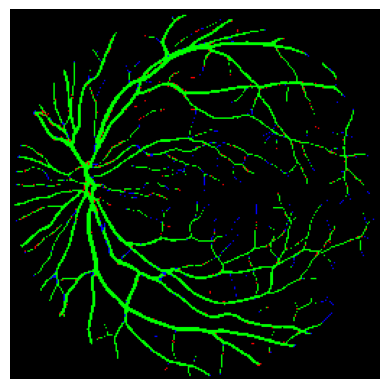

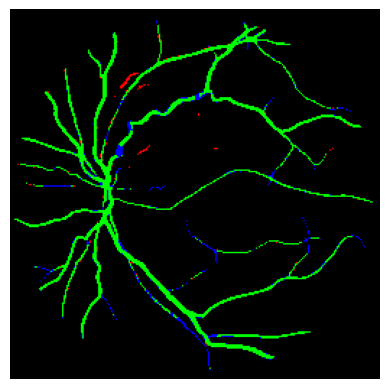

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


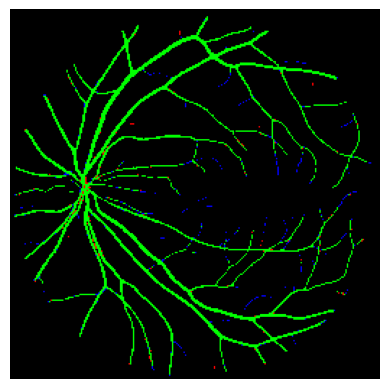

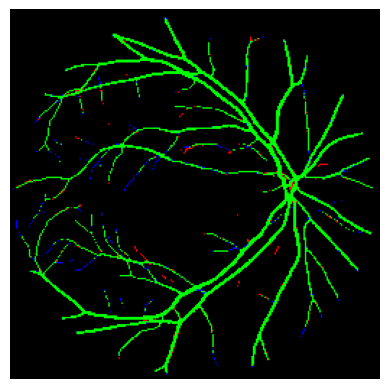

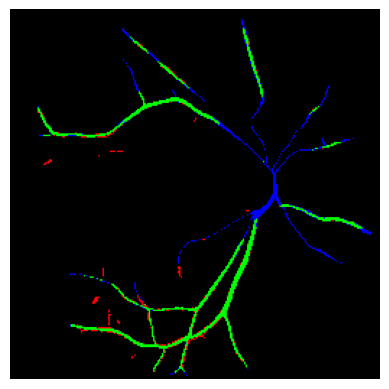

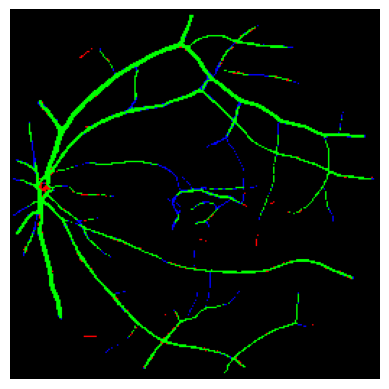

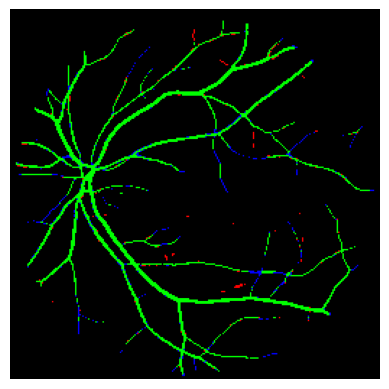

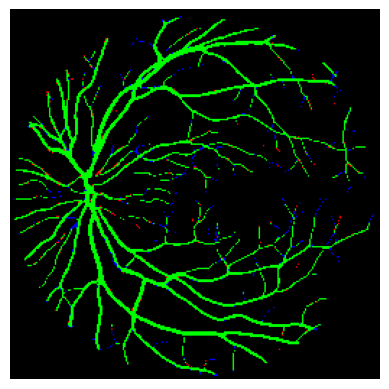

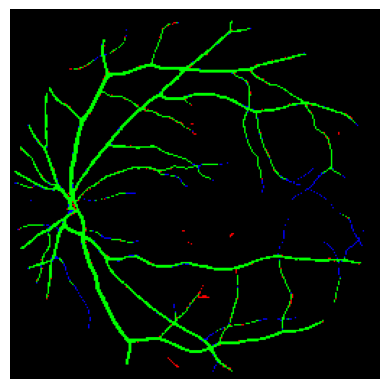

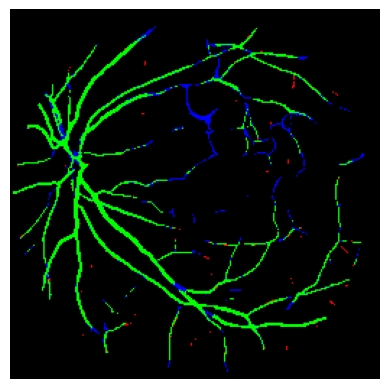

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


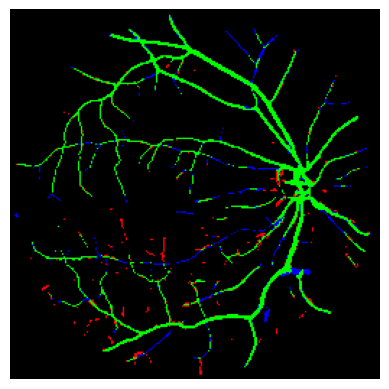

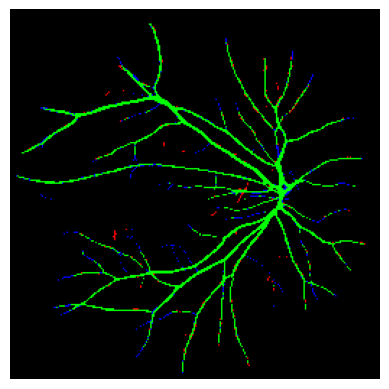

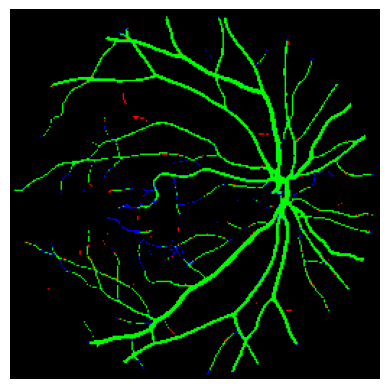

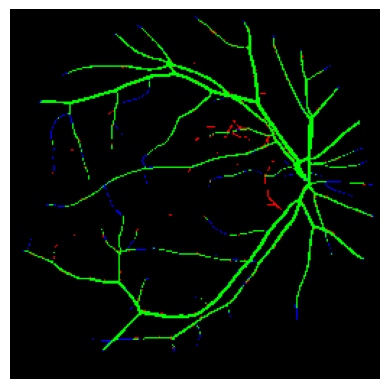

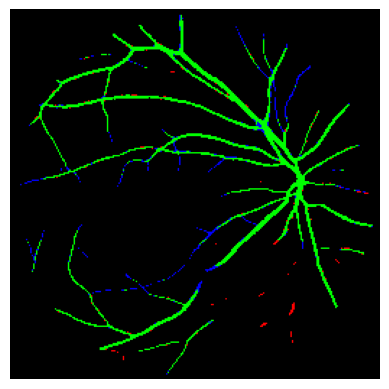

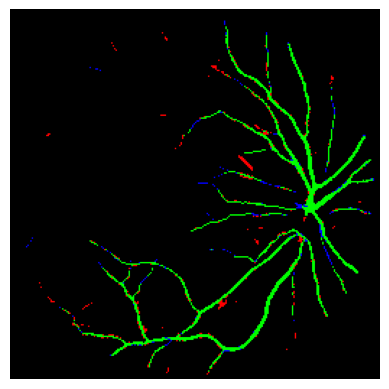

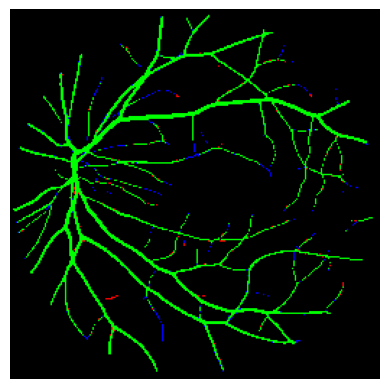

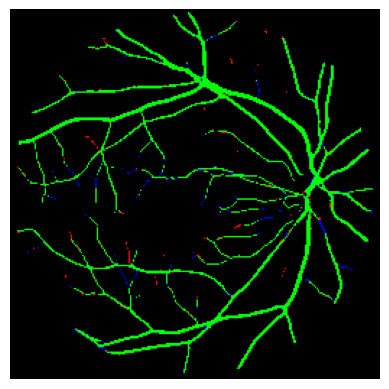

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


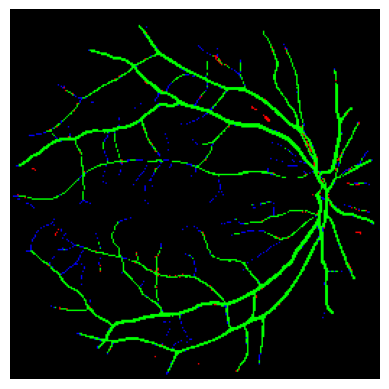

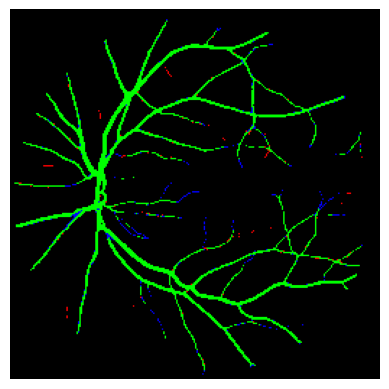

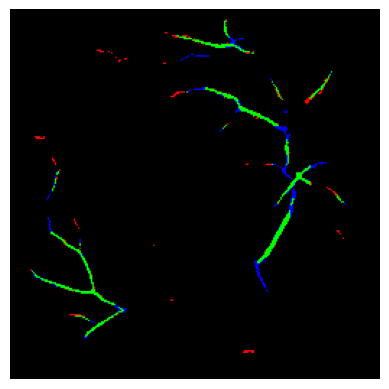

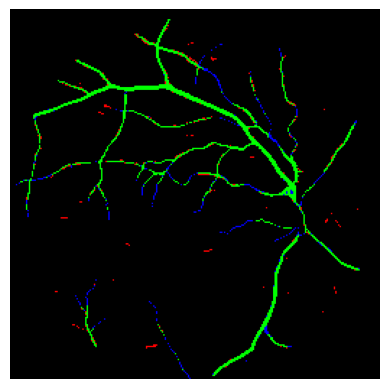

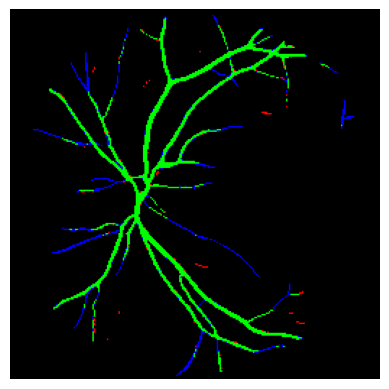

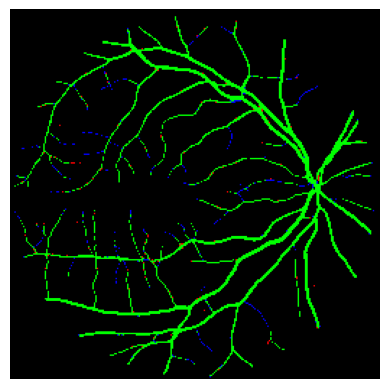

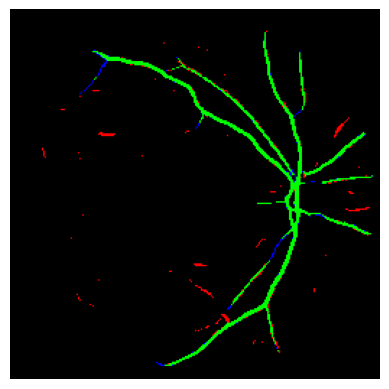

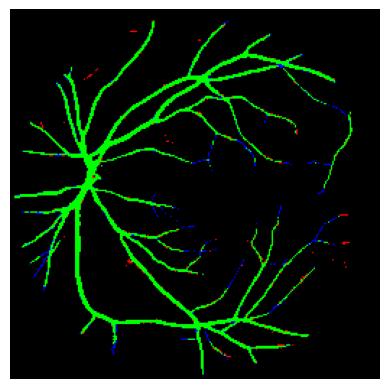

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


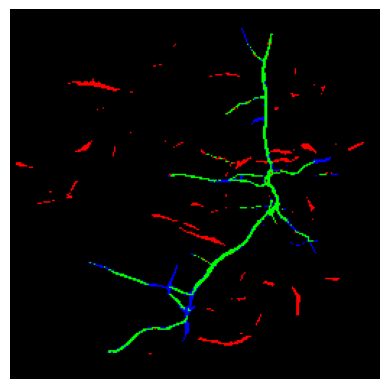

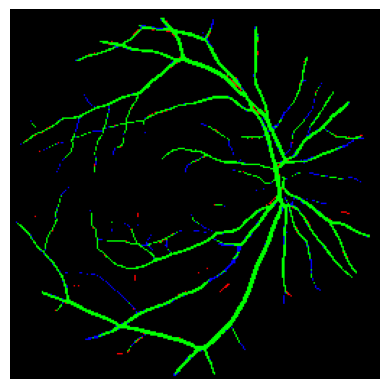

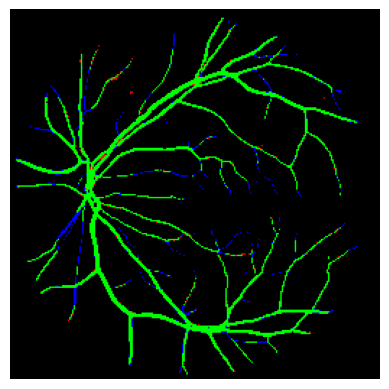

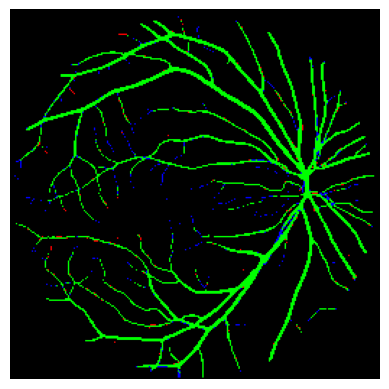

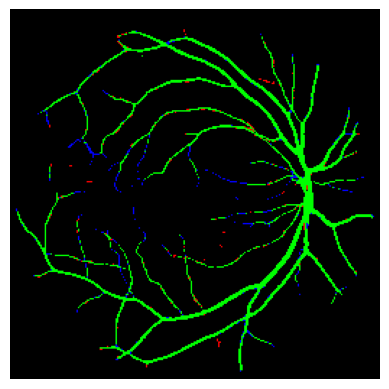

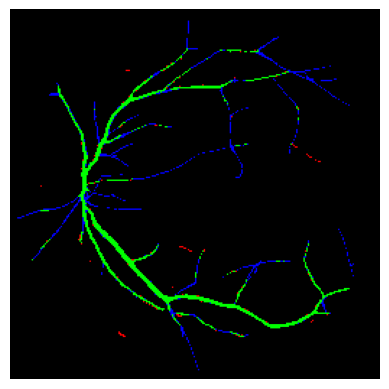

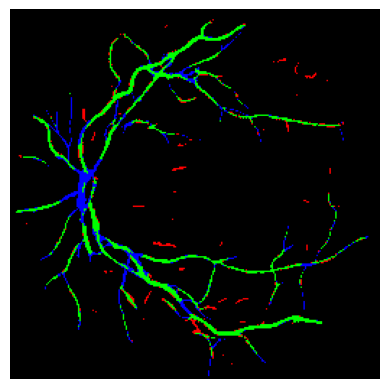

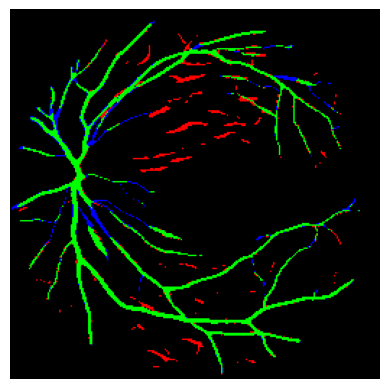

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


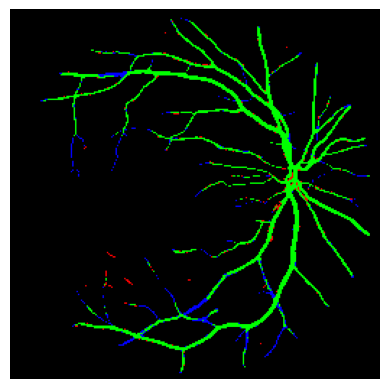

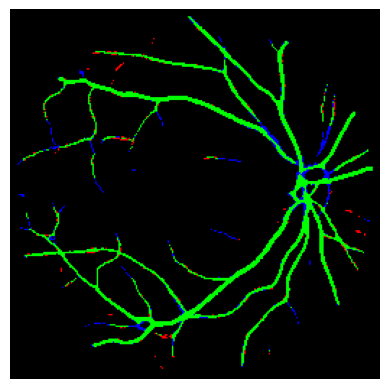

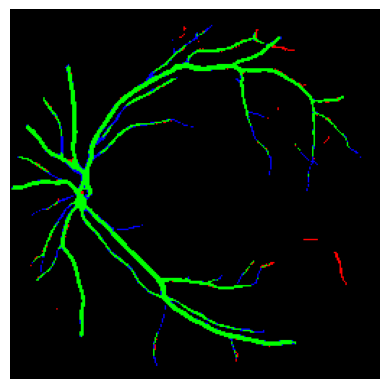

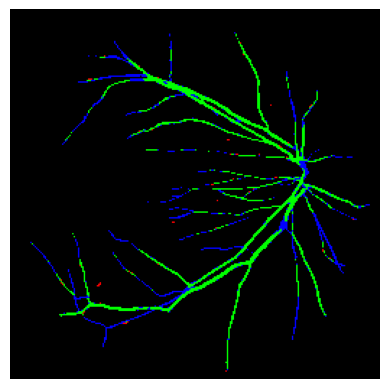

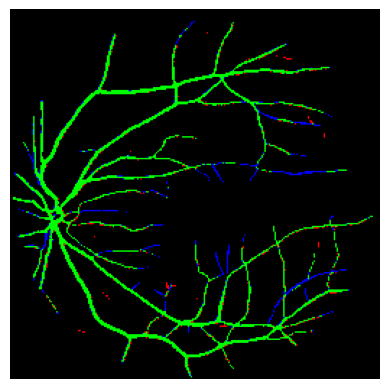

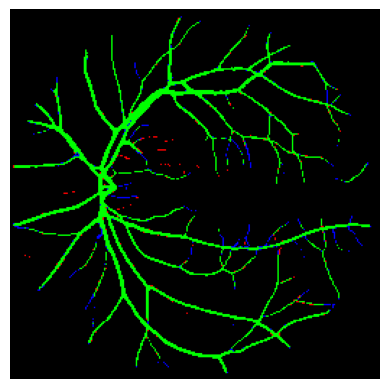

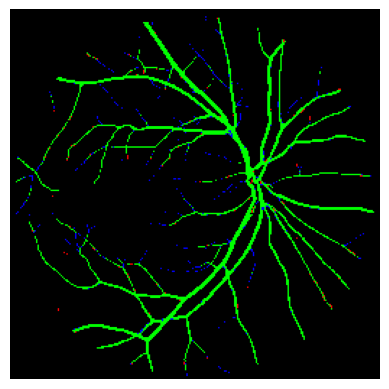

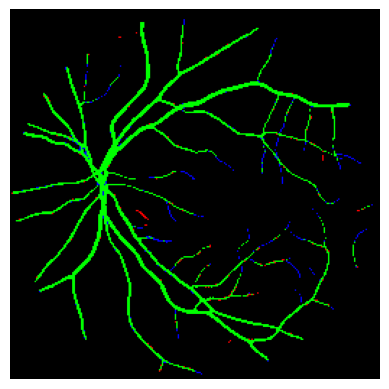

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


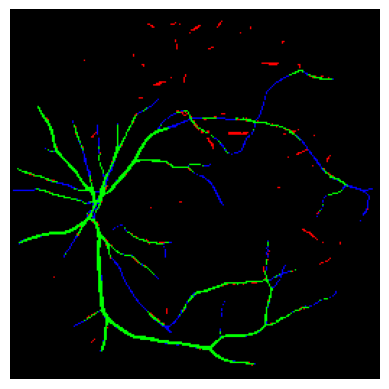

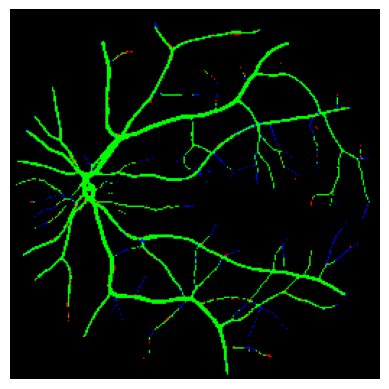

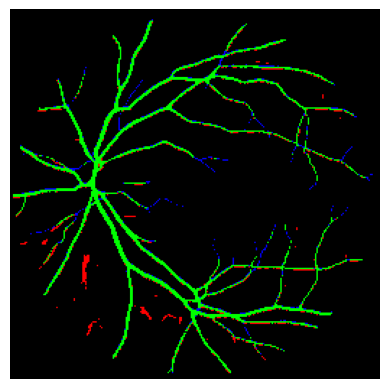

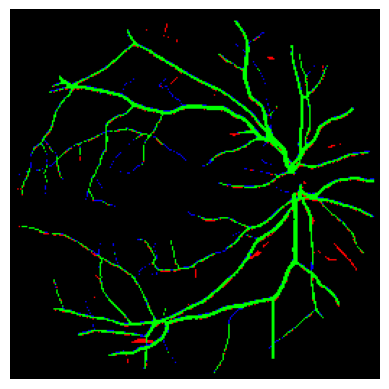

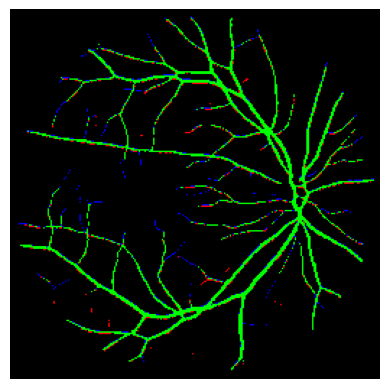

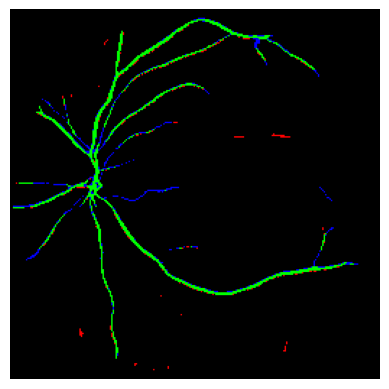

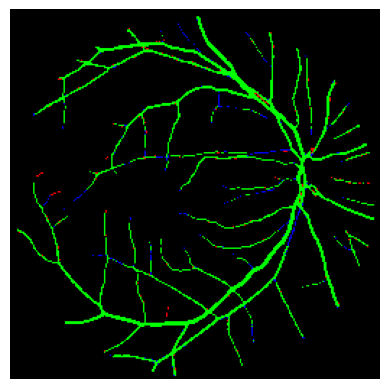

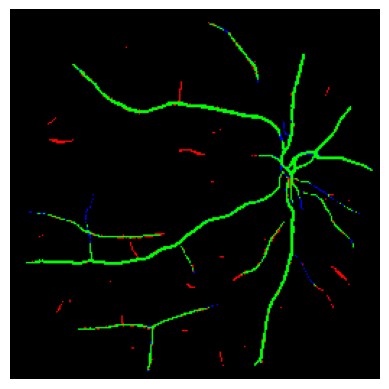

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


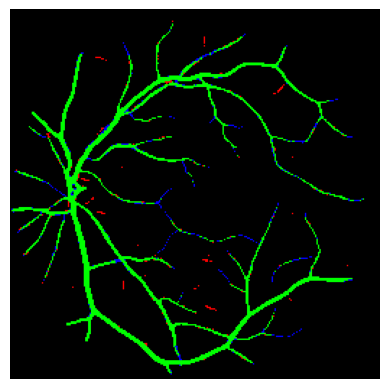

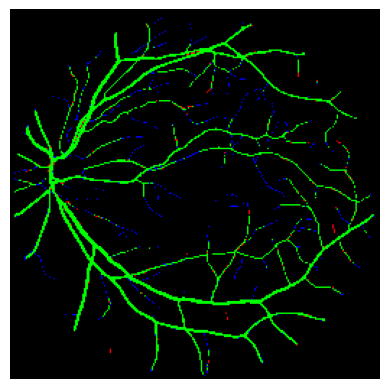

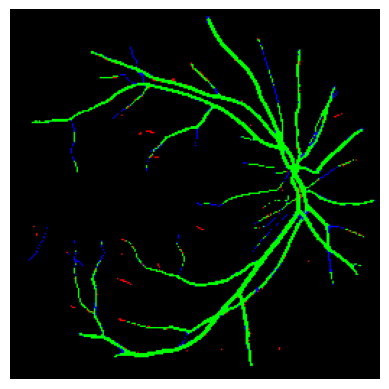

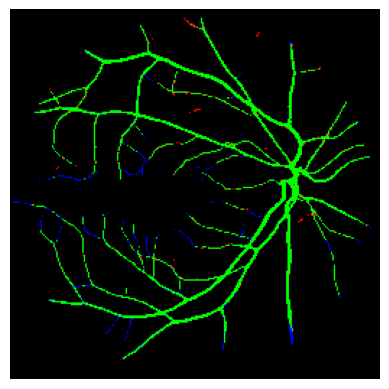

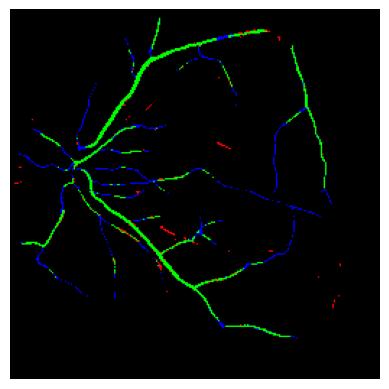

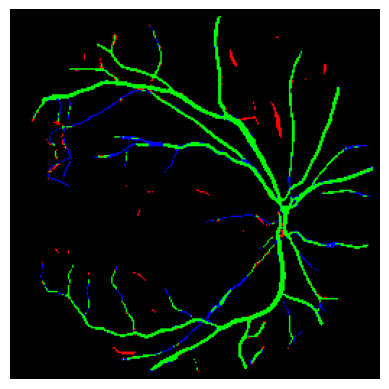

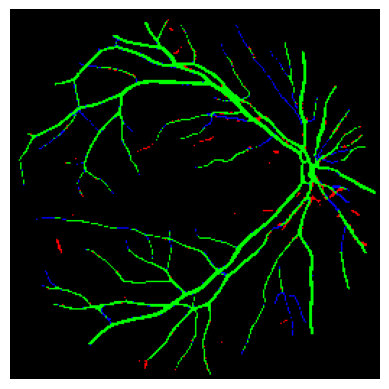

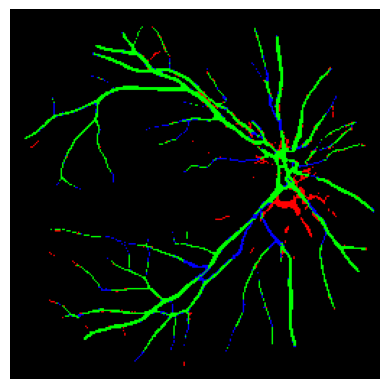

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


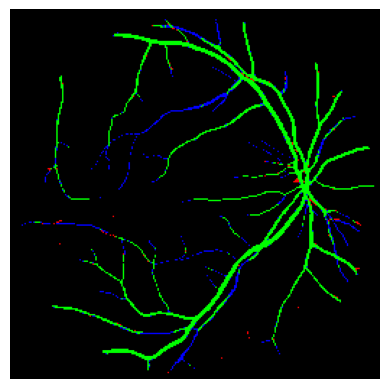

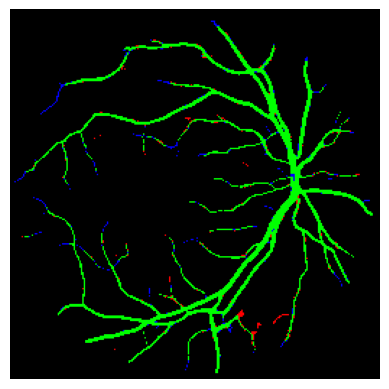

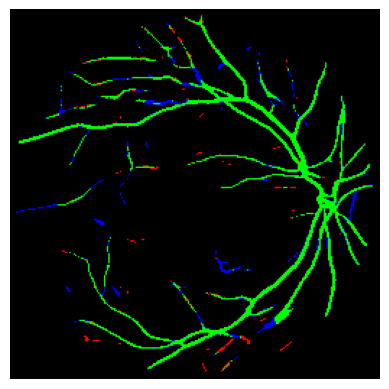

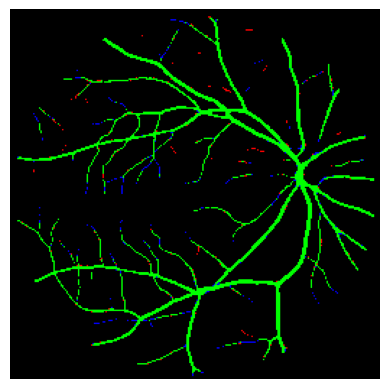

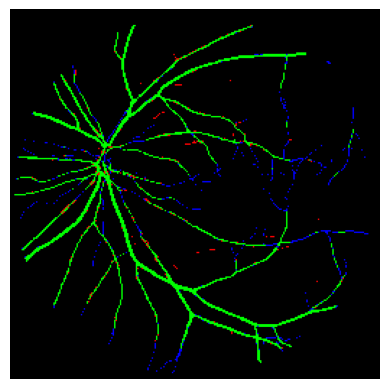

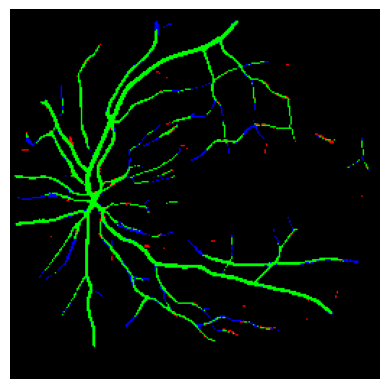

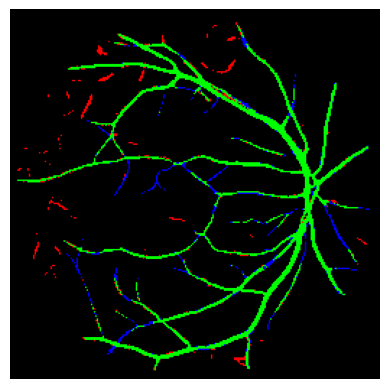

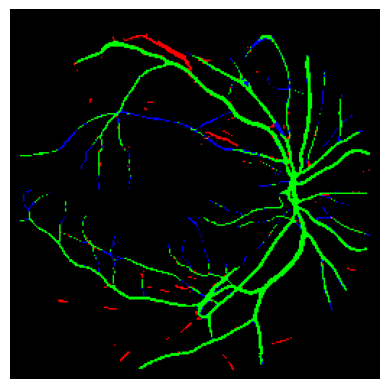

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


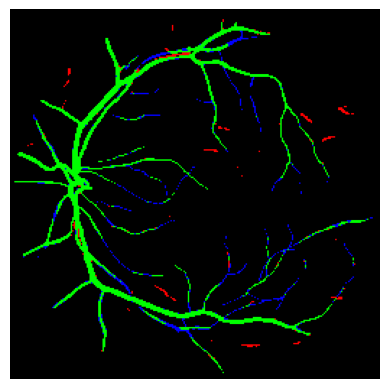

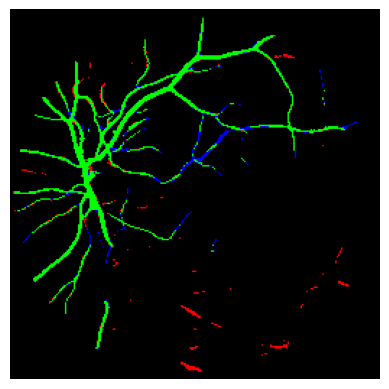

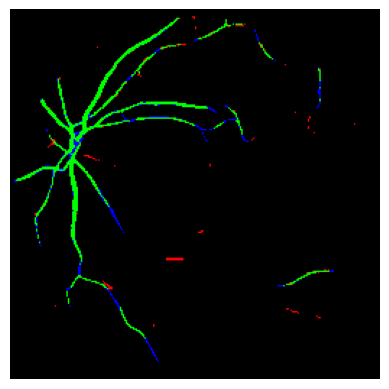

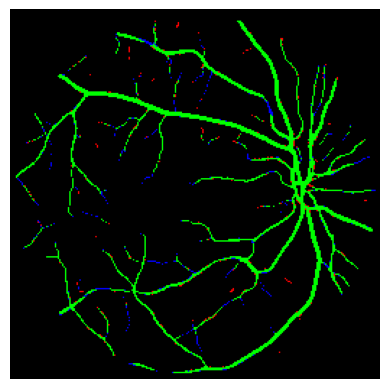

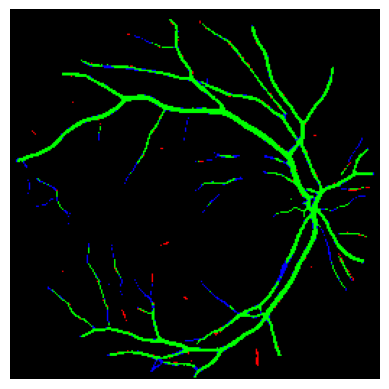

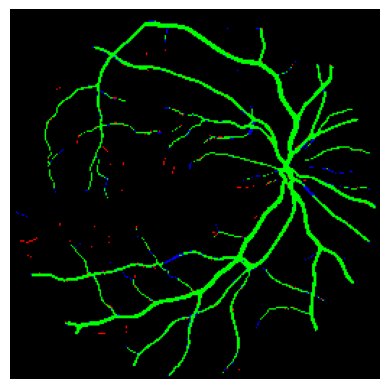

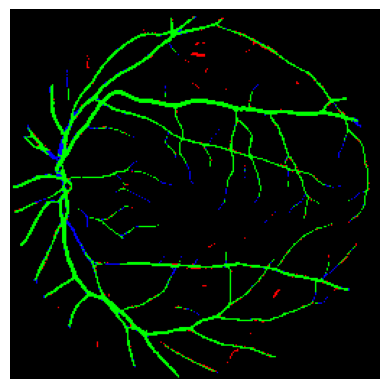

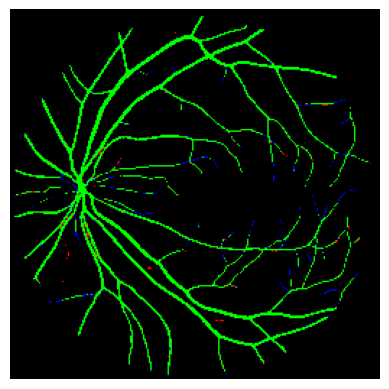

In [16]:
import matplotlib.pyplot as plt
import numpy as np

# true posivies (green), false positives (red), and false negatives (blue)
green = np.array([0, 1, 0])  # Green
red = np.array([1, 0, 0])    # Red
blue = np.array([0, 0, 1])   # Blue

# Create a function to apply the color mapping to the predicted binary mask and plot it
def plot_result_image(image, mask, model):
    # Predict the binary mask for the image using the model
    pred_mask = model.predict(image)

    pred_mask_binary = (pred_mask > 0.5).astype(np.float32)

    batch_size = image.shape[0]

    for i in range(batch_size):
        # Create a mask to visualize matching areas (green), false positives (red), and false negatives (blue)
        match_mask = np.zeros(image[i].shape)

        # where predicted and ground truth masks both equal 1
        match_mask[(pred_mask_binary[i, ..., 0] == 1) & (mask[i, ..., 0] == 1)] = green  # Green (matching)

        # where predicted mask is 1 but ground truth mask is 0
        match_mask[(pred_mask_binary[i, ..., 0] == 1) & (mask[i, ..., 0] == 0)] = red  # Red (false positive)

        # where predicted mask is 0 but ground truth mask is 1
        match_mask[(pred_mask_binary[i, ..., 0] == 0) & (mask[i, ..., 0] == 1)] = blue  # Blue (false negative)


        plt.imshow(match_mask)
        plt.axis('off')
        plt.show()


for image, mask in test_dataset:
    plot_result_image(image, mask, m1)


In [17]:
#Test on DRIVE dataset

import os

#Define the paths to the dataset folders

drive_image_folder = '/content/drive/MyDrive/Drive_dataset/Images_png/'
drive_mask_folder = '/content/drive/MyDrive/Drive_dataset/Masks_png'

drive_image_files = os.listdir(drive_image_folder)
drive_mask_files = os.listdir(drive_mask_folder)

drive_image_paths = [os.path.join(drive_image_folder, filename) for filename in drive_image_files]
drive_mask_paths = [os.path.join(drive_mask_folder, filename) for filename in drive_mask_files]

drive_image_paths = sorted(drive_image_paths)
drive_mask_paths = sorted(drive_mask_paths)

import tensorflow as tf

IMAGE_SIZE = 256
BATCH_SIZE = 20

def read_image(image_path, mask=False):
    image = tf.io.read_file(image_path)

    if mask:
        image = tf.image.decode_png(image, channels=1)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1] for mask images
        image = tf.where(image >= 0.5, 1.0, 0.0)
        image = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])
    else:
        image = tf.image.decode_png(image, channels=3)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1] for RGB images
        image = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])

    return image

def load_data(image_list, mask_list):
    image = read_image(image_list)
    mask = read_image(mask_list, mask=True)
    return image, mask

def data_generator(image_list, mask_list):
    dataset = tf.data.Dataset.from_tensor_slices((image_list, mask_list))
    dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    return dataset

drive_dataset = data_generator(drive_image_paths, drive_mask_paths)

print("Test Dataset:", drive_dataset)



Test Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(20, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(20, 256, 256, 1), dtype=tf.float32, name=None))>


In [18]:

def calculate_metrics(model, drive_dataset):
    accuracy_scores = []
    dice_scores = []
    tp_scores = []
    tn_scores = []
    fp_scores = []
    fn_scores = []

    for image, mask in drive_dataset:

        pred_mask = model.predict(image)


        mask = mask.numpy()

        pred_mask_binary = (pred_mask > 0.5).astype(np.float32)

        mask_flat = mask.flatten()
        pred_mask_flat = pred_mask_binary.flatten()

        # Calculate True Positives, True Negatives, False Positives, and False Negatives
        tp = np.sum(mask_flat * pred_mask_flat)
        tn = np.sum((1 - mask_flat) * (1 - pred_mask_flat))
        fp = np.sum((1 - mask_flat) * pred_mask_flat)
        fn = np.sum(mask_flat * (1 - pred_mask_flat))

        # Calculate accuracy, Dice score
        accuracy = (tp + tn) / (tp + tn + fp + fn)
        dice = (2.0 * tp) / (2.0 * tp + fp + fn)

        accuracy_scores.append(accuracy)
        dice_scores.append(dice)
        tp_scores.append(tp)
        tn_scores.append(tn)
        fp_scores.append(fp)
        fn_scores.append(fn)

    # Calculate and print average accuracy and Dice scores
    avg_accuracy = np.mean(accuracy_scores)
    avg_dice = np.mean(dice_scores)

    print(f"Average Accuracy: {avg_accuracy:.4f}")
    print(f"Average Dice Score: {avg_dice:.4f}")

    TP = np.mean(tp_scores)
    TN = np.mean(tn_scores)
    FP = np.mean(fp_scores)
    FN = np.mean(fn_scores)

    f1 = 2 * TP / (2 * TP + FP + FN)
    recall = TP/(FN+TP)
    precision = TP/(TP+FP)
    specificity = TN/(FP+TN)
    MCC = (TP*TN - FP*FN)/ np.sqrt((TP+FP)*(TP+FN)*(TN+FP)*(TN+FN))

    print("Precision Score:", precision)
    print("Sensitivity/Recall Score:", recall)
    print("Specificity Score:", specificity)
    print("F1 Score:", f1)
    print("MCC :", MCC)



calculate_metrics(m1, drive_dataset)


1/1 ━━━━━━━━━━━━━━━━━━━━ 44s 44s/step
Average Accuracy: 0.9589
Average Dice Score: 0.7533
Precision Score: 0.7818201
Sensitivity/Recall Score: 0.72670496
Specificity Score: 0.98083365
F1 Score: 0.7532556767916389
MCC : 0.7314465


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


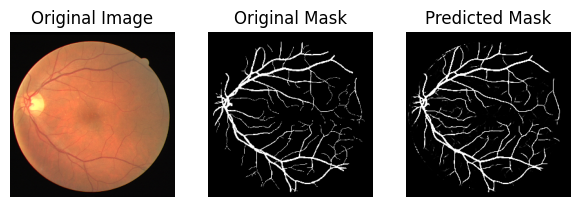

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


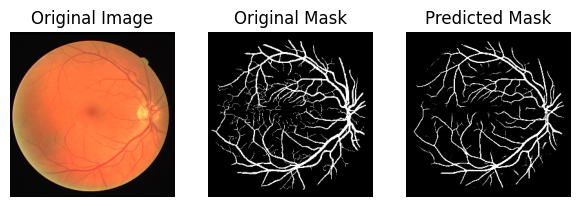

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


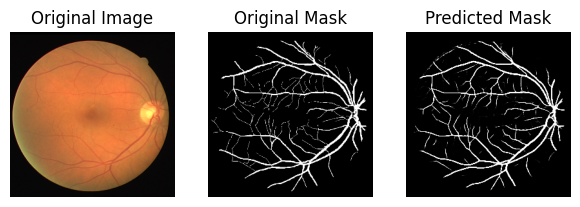

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


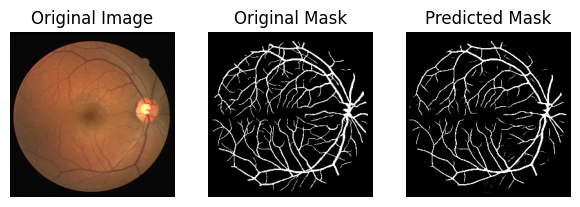

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


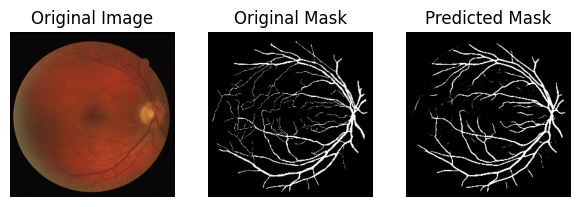

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


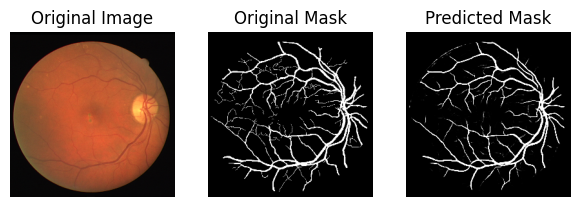

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


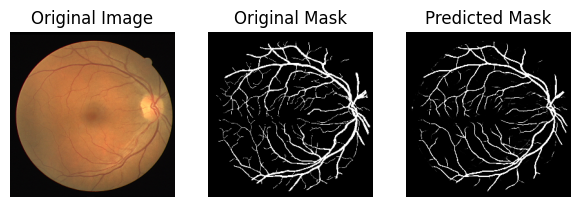

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


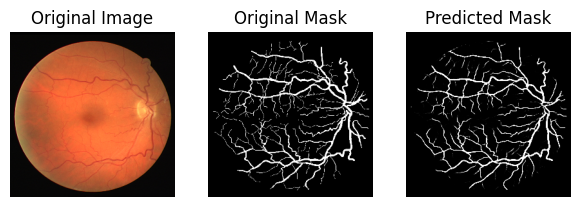

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


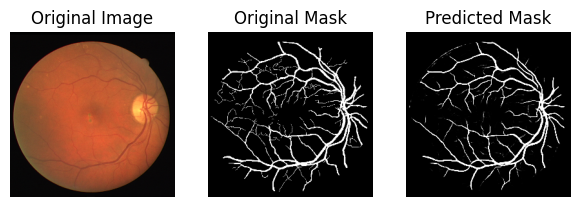

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


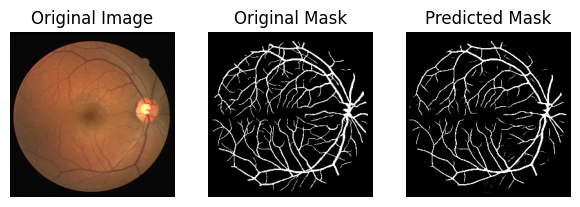

In [19]:
show_images(drive_dataset, model=m1, explain=True, n_images=10, SIZE=(20,8))